In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST
from External.create_k_nearest import patch_together



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "pancreas_full"

threshold = 12

# for the filename
parameters = "2-0_5-t12"

In [6]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)

    
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)
    
# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))    

cluster_centers, labels = k_means_pp(k, pca, metric=metric, return_labels=True)
unique_labels = np.unique(labels)


print("Time for data preperation: ", time.time()-start)

sklearn is done: 111.79027676582336
My own part is done: 4.042181015014648
Time for data preperation:  456.1835813522339


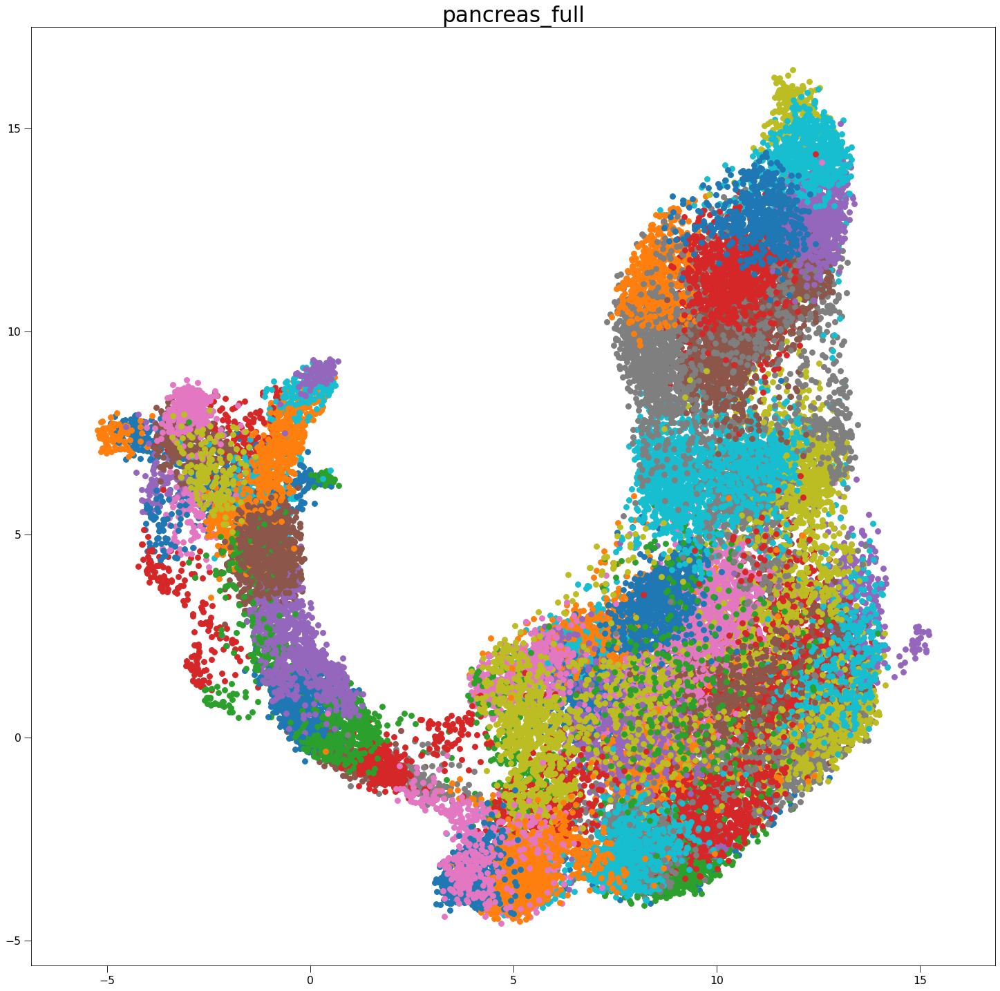

In [7]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
ax.get_legend().remove()
plt.show()

In [8]:
np.argsort([1,2,36])

0 not in [1,2,3]

True

In [9]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=11,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/103 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/378 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3222 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3222 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3222 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/377 [00:00<?, ?it/s]

update Arr 3222 -> 2929
update Arr 2929 -> 2658
update Arr 2658 -> 2408
added 2 edges early
update Arr 2408 -> 2170
update Arr 2170 -> 1964
update Arr 1964 -> 1781
update Arr 1781 -> 1614
update Arr 1614 -> 1464
update Arr 1464 -> 1330
update Arr 1330 -> 1203
update Arr 1203 -> 1093
update Arr 1093 -> 991
update Arr 991 -> 895
update Arr 895 -> 810
update Arr 810 -> 734
update Arr 734 -> 667
update Arr 667 -> 604
update Arr 604 -> 542
update Arr 542 -> 484
update Arr 484 -> 439
update Arr 439 -> 393
update Arr 393 -> 386
update Arr 386 -> 384
update Arr 384 -> 380
update Arr 380 -> 377
added 2 edges early


calculating the densities for the density criterion:   0%|          | 0/555 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5015 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5015 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5015 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/554 [00:00<?, ?it/s]

update Arr 5015 -> 4528
added 3 edges early
update Arr 4528 -> 4105
update Arr 4105 -> 3723
update Arr 3723 -> 3383
update Arr 3383 -> 3072
update Arr 3072 -> 2782
update Arr 2782 -> 2525
update Arr 2525 -> 2295
update Arr 2295 -> 2082
update Arr 2082 -> 1889
update Arr 1889 -> 1711
update Arr 1711 -> 1554
update Arr 1554 -> 1401
update Arr 1401 -> 1269
update Arr 1269 -> 1146
update Arr 1146 -> 1041
update Arr 1041 -> 946
update Arr 946 -> 854
update Arr 854 -> 773
update Arr 773 -> 701
update Arr 701 -> 635
update Arr 635 -> 573
update Arr 573 -> 563
update Arr 563 -> 561
update Arr 561 -> 560
update Arr 560 -> 557
update Arr 557 -> 556
update Arr 556 -> 556
update Arr 556 -> 555


calculating the densities for the density criterion:   0%|          | 0/203 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1852 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1852 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1852 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/202 [00:00<?, ?it/s]

update Arr 1852 -> 1653
update Arr 1653 -> 1488
update Arr 1488 -> 1352
update Arr 1352 -> 1216
update Arr 1216 -> 1103
update Arr 1103 -> 1000
update Arr 1000 -> 906
update Arr 906 -> 820
update Arr 820 -> 743
update Arr 743 -> 672
update Arr 672 -> 609
update Arr 609 -> 550
update Arr 550 -> 493
update Arr 493 -> 444
update Arr 444 -> 401
update Arr 401 -> 363
update Arr 363 -> 328
update Arr 328 -> 297
update Arr 297 -> 269
update Arr 269 -> 243
update Arr 243 -> 216
update Arr 216 -> 212
update Arr 212 -> 208
update Arr 208 -> 205
update Arr 205 -> 203
update Arr 203 -> 202


calculating the densities for the density criterion:   0%|          | 0/109 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/915 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/915 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/915 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/108 [00:00<?, ?it/s]

update Arr 915 -> 820
update Arr 820 -> 741
update Arr 741 -> 673
update Arr 673 -> 610
update Arr 610 -> 548
update Arr 548 -> 491
update Arr 491 -> 441
update Arr 441 -> 398
update Arr 398 -> 358
update Arr 358 -> 316
update Arr 316 -> 287
update Arr 287 -> 259
update Arr 259 -> 228
update Arr 228 -> 206
update Arr 206 -> 185
update Arr 185 -> 167
update Arr 167 -> 150
update Arr 150 -> 135
update Arr 135 -> 118
update Arr 118 -> 116
update Arr 116 -> 113
update Arr 113 -> 112
update Arr 112 -> 110
update Arr 110 -> 109
update Arr 109 -> 109


calculating the densities for the density criterion:   0%|          | 0/498 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4423 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4423 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4423 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/497 [00:00<?, ?it/s]

update Arr 4423 -> 4020
added 2 edges early
update Arr 4020 -> 3643
update Arr 3643 -> 3304
update Arr 3304 -> 3001
update Arr 3001 -> 2724
update Arr 2724 -> 2475
update Arr 2475 -> 2244
update Arr 2244 -> 2037
update Arr 2037 -> 1851
update Arr 1851 -> 1681
update Arr 1681 -> 1525
update Arr 1525 -> 1386
update Arr 1386 -> 1258
update Arr 1258 -> 1137
update Arr 1137 -> 1032
update Arr 1032 -> 937
update Arr 937 -> 851
update Arr 851 -> 771
update Arr 771 -> 700
update Arr 700 -> 629
update Arr 629 -> 567
update Arr 567 -> 512
update Arr 512 -> 506
update Arr 506 -> 505
update Arr 505 -> 503
update Arr 503 -> 501
update Arr 501 -> 499
update Arr 499 -> 499
update Arr 499 -> 498


calculating the densities for the density criterion:   0%|          | 0/348 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3073 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3073 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3073 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/347 [00:00<?, ?it/s]

update Arr 3073 -> 2776
update Arr 2776 -> 2516
update Arr 2516 -> 2269
update Arr 2269 -> 2062
update Arr 2062 -> 1869
update Arr 1869 -> 1691
update Arr 1691 -> 1537
update Arr 1537 -> 1392
update Arr 1392 -> 1264
update Arr 1264 -> 1137
update Arr 1137 -> 1030
update Arr 1030 -> 934
update Arr 934 -> 847
update Arr 847 -> 767
update Arr 767 -> 694
update Arr 694 -> 630
update Arr 630 -> 566
update Arr 566 -> 508
update Arr 508 -> 454
update Arr 454 -> 407
update Arr 407 -> 369
update Arr 369 -> 356
update Arr 356 -> 356
update Arr 356 -> 355
update Arr 355 -> 354
update Arr 354 -> 353
update Arr 353 -> 351
update Arr 351 -> 350
update Arr 350 -> 349
update Arr 349 -> 348


calculating the densities for the density criterion:   0%|          | 0/222 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1995 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1995 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1995 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/221 [00:00<?, ?it/s]

update Arr 1995 -> 1793
added 2 edges early
update Arr 1793 -> 1621
update Arr 1621 -> 1464
update Arr 1464 -> 1328
update Arr 1328 -> 1196
update Arr 1196 -> 1087
update Arr 1087 -> 983
update Arr 983 -> 892
update Arr 892 -> 807
update Arr 807 -> 731
update Arr 731 -> 663
update Arr 663 -> 602
update Arr 602 -> 547
update Arr 547 -> 495
update Arr 495 -> 449
update Arr 449 -> 405
update Arr 405 -> 366
update Arr 366 -> 327
update Arr 327 -> 297
update Arr 297 -> 265
update Arr 265 -> 239
update Arr 239 -> 230
update Arr 230 -> 229
update Arr 229 -> 226
update Arr 226 -> 225
update Arr 225 -> 224
update Arr 224 -> 222


calculating the densities for the density criterion:   0%|          | 0/519 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4760 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4760 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4760 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/518 [00:00<?, ?it/s]

update Arr 4760 -> 4315
added 6 edges early
update Arr 4315 -> 3912
update Arr 3912 -> 3549
update Arr 3549 -> 3224
update Arr 3224 -> 2925
update Arr 2925 -> 2657
update Arr 2657 -> 2410
update Arr 2410 -> 2187
update Arr 2187 -> 1988
update Arr 1988 -> 1807
update Arr 1807 -> 1641
update Arr 1641 -> 1491
update Arr 1491 -> 1353
update Arr 1353 -> 1224
update Arr 1224 -> 1107
update Arr 1107 -> 1002
update Arr 1002 -> 909
update Arr 909 -> 825
update Arr 825 -> 743
update Arr 743 -> 672
update Arr 672 -> 605
update Arr 605 -> 548
update Arr 548 -> 528
update Arr 528 -> 527
update Arr 527 -> 527
update Arr 527 -> 525
update Arr 525 -> 522
update Arr 522 -> 521
update Arr 521 -> 520
update Arr 520 -> 520
update Arr 520 -> 519


calculating the densities for the density criterion:   0%|          | 0/766 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/6980 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/6980 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/6980 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/765 [00:00<?, ?it/s]

update Arr 6980 -> 6341
added 8 edges early
update Arr 6341 -> 5759
update Arr 5759 -> 5229
update Arr 5229 -> 4734
update Arr 4734 -> 4290
update Arr 4290 -> 3898
update Arr 3898 -> 3543
update Arr 3543 -> 3220
update Arr 3220 -> 2923
update Arr 2923 -> 2657
update Arr 2657 -> 2412
update Arr 2412 -> 2188
update Arr 2188 -> 1987
update Arr 1987 -> 1804
update Arr 1804 -> 1635
update Arr 1635 -> 1481
update Arr 1481 -> 1342
update Arr 1342 -> 1218
update Arr 1218 -> 1106
update Arr 1106 -> 1005
update Arr 1005 -> 913
update Arr 913 -> 828
update Arr 828 -> 774
update Arr 774 -> 772
update Arr 772 -> 771
update Arr 771 -> 769
update Arr 769 -> 768
update Arr 768 -> 765
added 2 edges early


calculating the densities for the density criterion:   0%|          | 0/182 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1735 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1735 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1735 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/181 [00:00<?, ?it/s]

update Arr 1735 -> 1540
update Arr 1540 -> 1374
update Arr 1374 -> 1231
update Arr 1231 -> 1118
update Arr 1118 -> 1013
update Arr 1013 -> 915
update Arr 915 -> 827
update Arr 827 -> 747
update Arr 747 -> 677
update Arr 677 -> 604
update Arr 604 -> 547
update Arr 547 -> 497
update Arr 497 -> 451
update Arr 451 -> 409
update Arr 409 -> 369
update Arr 369 -> 334
update Arr 334 -> 303
update Arr 303 -> 269
update Arr 269 -> 243
update Arr 243 -> 211
update Arr 211 -> 190
update Arr 190 -> 184
update Arr 184 -> 184
update Arr 184 -> 183
update Arr 183 -> 182
update Arr 182 -> 182


calculating the densities for the density criterion:   0%|          | 0/307 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2858 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2858 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2858 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/306 [00:00<?, ?it/s]

update Arr 2858 -> 2549
update Arr 2549 -> 2317
update Arr 2317 -> 2100
update Arr 2100 -> 1905
update Arr 1905 -> 1728
update Arr 1728 -> 1567
update Arr 1567 -> 1418
update Arr 1418 -> 1280
update Arr 1280 -> 1159
update Arr 1159 -> 1048
update Arr 1048 -> 952
update Arr 952 -> 862
update Arr 862 -> 781
update Arr 781 -> 702
update Arr 702 -> 632
update Arr 632 -> 565
update Arr 565 -> 512
update Arr 512 -> 464
update Arr 464 -> 417
update Arr 417 -> 377
update Arr 377 -> 342
update Arr 342 -> 316
update Arr 316 -> 314
update Arr 314 -> 312
update Arr 312 -> 310
update Arr 310 -> 309
update Arr 309 -> 308
update Arr 308 -> 307


calculating the densities for the density criterion:   0%|          | 0/505 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4539 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4539 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4539 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/504 [00:00<?, ?it/s]

update Arr 4539 -> 4121
added 5 edges early
update Arr 4121 -> 3728
update Arr 3728 -> 3380
update Arr 3380 -> 3072
update Arr 3072 -> 2787
update Arr 2787 -> 2530
update Arr 2530 -> 2292
update Arr 2292 -> 2080
update Arr 2080 -> 1890
update Arr 1890 -> 1718
update Arr 1718 -> 1560
update Arr 1560 -> 1418
update Arr 1418 -> 1289
update Arr 1289 -> 1164
update Arr 1164 -> 1057
update Arr 1057 -> 954
update Arr 954 -> 867
update Arr 867 -> 779
update Arr 779 -> 701
update Arr 701 -> 632
update Arr 632 -> 572
update Arr 572 -> 518
update Arr 518 -> 514
update Arr 514 -> 512
update Arr 512 -> 508
update Arr 508 -> 508
update Arr 508 -> 507
update Arr 507 -> 506
update Arr 506 -> 505


calculating the densities for the density criterion:   0%|          | 0/336 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3146 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/335 [00:00<?, ?it/s]

update Arr 3146 -> 2848
added 3 edges early
update Arr 2848 -> 2589
update Arr 2589 -> 2344
update Arr 2344 -> 2130
update Arr 2130 -> 1935
update Arr 1935 -> 1748
update Arr 1748 -> 1582
update Arr 1582 -> 1435
update Arr 1435 -> 1298
update Arr 1298 -> 1178
update Arr 1178 -> 1065
update Arr 1065 -> 966
update Arr 966 -> 878
update Arr 878 -> 792
update Arr 792 -> 717
update Arr 717 -> 651
update Arr 651 -> 591
update Arr 591 -> 536
update Arr 536 -> 478
update Arr 478 -> 432
update Arr 432 -> 391
update Arr 391 -> 354
update Arr 354 -> 343
update Arr 343 -> 343
update Arr 343 -> 342
update Arr 342 -> 341
update Arr 341 -> 340
update Arr 340 -> 339
update Arr 339 -> 338
update Arr 338 -> 336


calculating the densities for the density criterion:   0%|          | 0/86 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/781 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/781 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/781 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/85 [00:00<?, ?it/s]

update Arr 781 -> 703
update Arr 703 -> 638
update Arr 638 -> 576
update Arr 576 -> 518
update Arr 518 -> 466
update Arr 466 -> 418
update Arr 418 -> 377
update Arr 377 -> 331
update Arr 331 -> 292
update Arr 292 -> 265
update Arr 265 -> 240
update Arr 240 -> 214
update Arr 214 -> 190
update Arr 190 -> 171
update Arr 171 -> 152
update Arr 152 -> 135
update Arr 135 -> 122
update Arr 122 -> 108
update Arr 108 -> 94
update Arr 94 -> 92
update Arr 92 -> 90
update Arr 90 -> 87
update Arr 87 -> 86


calculating the densities for the density criterion:   0%|          | 0/713 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/6526 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/6526 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/6526 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/712 [00:00<?, ?it/s]

update Arr 6526 -> 5927
added 4 edges early
update Arr 5927 -> 5371
update Arr 5371 -> 4881
update Arr 4881 -> 4433
added 2 edges early
update Arr 4433 -> 4022
update Arr 4022 -> 3656
update Arr 3656 -> 3320
update Arr 3320 -> 3013
update Arr 3013 -> 2736
update Arr 2736 -> 2485
update Arr 2485 -> 2253
update Arr 2253 -> 2045
update Arr 2045 -> 1859
update Arr 1859 -> 1688
update Arr 1688 -> 1534
update Arr 1534 -> 1390
update Arr 1390 -> 1263
update Arr 1263 -> 1142
update Arr 1142 -> 1038
update Arr 1038 -> 943
update Arr 943 -> 857
update Arr 857 -> 777
update Arr 777 -> 722
update Arr 722 -> 719
update Arr 719 -> 717
update Arr 717 -> 715
update Arr 715 -> 714
update Arr 714 -> 712


calculating the densities for the density criterion:   0%|          | 0/418 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3640 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3640 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3640 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/417 [00:00<?, ?it/s]

update Arr 3640 -> 3270
added 3 edges early
update Arr 3270 -> 2971
update Arr 2971 -> 2686
update Arr 2686 -> 2429
update Arr 2429 -> 2190
update Arr 2190 -> 1985
update Arr 1985 -> 1798
update Arr 1798 -> 1628
update Arr 1628 -> 1476
update Arr 1476 -> 1337
update Arr 1337 -> 1211
update Arr 1211 -> 1095
update Arr 1095 -> 990
update Arr 990 -> 894
update Arr 894 -> 812
update Arr 812 -> 736
update Arr 736 -> 669
update Arr 669 -> 607
update Arr 607 -> 550
update Arr 550 -> 499
update Arr 499 -> 452
update Arr 452 -> 422
added 2 edges early
update Arr 422 -> 422
update Arr 422 -> 421
update Arr 421 -> 420
update Arr 420 -> 419
update Arr 419 -> 418
update Arr 418 -> 417


calculating the densities for the density criterion:   0%|          | 0/170 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1523 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1523 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1523 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/169 [00:00<?, ?it/s]

update Arr 1523 -> 1384
update Arr 1384 -> 1256
update Arr 1256 -> 1140
update Arr 1140 -> 1033
update Arr 1033 -> 938
update Arr 938 -> 847
update Arr 847 -> 767
update Arr 767 -> 694
update Arr 694 -> 627
update Arr 627 -> 564
update Arr 564 -> 509
update Arr 509 -> 455
update Arr 455 -> 411
update Arr 411 -> 371
update Arr 371 -> 334
update Arr 334 -> 303
update Arr 303 -> 274
update Arr 274 -> 249
update Arr 249 -> 221
update Arr 221 -> 197
update Arr 197 -> 176
update Arr 176 -> 174
update Arr 174 -> 173
update Arr 173 -> 172
update Arr 172 -> 170


calculating the densities for the density criterion:   0%|          | 0/368 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3497 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3497 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3497 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/367 [00:00<?, ?it/s]

update Arr 3497 -> 3165
added 2 edges early
update Arr 3165 -> 2859
update Arr 2859 -> 2569
update Arr 2569 -> 2327
update Arr 2327 -> 2114
update Arr 2114 -> 1919
update Arr 1919 -> 1738
update Arr 1738 -> 1571
update Arr 1571 -> 1426
update Arr 1426 -> 1294
update Arr 1294 -> 1175
update Arr 1175 -> 1065
update Arr 1065 -> 956
update Arr 956 -> 863
update Arr 863 -> 783
update Arr 783 -> 708
update Arr 708 -> 641
update Arr 641 -> 578
update Arr 578 -> 522
update Arr 522 -> 465
update Arr 465 -> 420
update Arr 420 -> 379
update Arr 379 -> 377
update Arr 377 -> 373
update Arr 373 -> 372
update Arr 372 -> 371
update Arr 371 -> 370
update Arr 370 -> 369
update Arr 369 -> 368


calculating the densities for the density criterion:   0%|          | 0/477 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4449 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4449 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4449 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/476 [00:00<?, ?it/s]

update Arr 4449 -> 4042
added 3 edges early
update Arr 4042 -> 3630
update Arr 3630 -> 3292
added 2 edges early
update Arr 3292 -> 2980
update Arr 2980 -> 2690
added 2 edges early
update Arr 2690 -> 2442
update Arr 2442 -> 2210
update Arr 2210 -> 2003
update Arr 2003 -> 1820
update Arr 1820 -> 1650
update Arr 1650 -> 1496
update Arr 1496 -> 1357
update Arr 1357 -> 1232
update Arr 1232 -> 1113
update Arr 1113 -> 1010
update Arr 1010 -> 916
update Arr 916 -> 828
update Arr 828 -> 745
update Arr 745 -> 672
update Arr 672 -> 610
update Arr 610 -> 549
update Arr 549 -> 498
update Arr 498 -> 486
update Arr 486 -> 481
update Arr 481 -> 481
update Arr 481 -> 480
update Arr 480 -> 480
update Arr 480 -> 479
update Arr 479 -> 478
update Arr 478 -> 477


calculating the densities for the density criterion:   0%|          | 0/687 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/6170 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/6170 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/6170 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/686 [00:00<?, ?it/s]

update Arr 6170 -> 5606
added 4 edges early
update Arr 5606 -> 5069
update Arr 5069 -> 4583
update Arr 4583 -> 4136
update Arr 4136 -> 3757
update Arr 3757 -> 3409
update Arr 3409 -> 3095
update Arr 3095 -> 2809
update Arr 2809 -> 2552
update Arr 2552 -> 2316
update Arr 2316 -> 2102
update Arr 2102 -> 1910
update Arr 1910 -> 1735
update Arr 1735 -> 1571
update Arr 1571 -> 1427
update Arr 1427 -> 1290
update Arr 1290 -> 1170
update Arr 1170 -> 1062
update Arr 1062 -> 958
update Arr 958 -> 869
update Arr 869 -> 781
update Arr 781 -> 708
update Arr 708 -> 695
update Arr 695 -> 690
update Arr 690 -> 689
update Arr 689 -> 689
update Arr 689 -> 688
update Arr 688 -> 687
update Arr 687 -> 687


calculating the densities for the density criterion:   0%|          | 0/102 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/896 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/896 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/896 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 896 -> 804
update Arr 804 -> 727
update Arr 727 -> 655
update Arr 655 -> 595
update Arr 595 -> 536
update Arr 536 -> 481
update Arr 481 -> 434
update Arr 434 -> 389
update Arr 389 -> 346
update Arr 346 -> 313
update Arr 313 -> 276
update Arr 276 -> 248
update Arr 248 -> 219
update Arr 219 -> 191
update Arr 191 -> 173
update Arr 173 -> 155
update Arr 155 -> 138
update Arr 138 -> 122
update Arr 122 -> 109
update Arr 109 -> 106
update Arr 106 -> 103
update Arr 103 -> 102


calculating the densities for the density criterion:   0%|          | 0/866 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/7779 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/7779 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/7779 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/865 [00:00<?, ?it/s]

update Arr 7779 -> 7065
added 7 edges early
update Arr 7065 -> 6419
update Arr 6419 -> 5827
update Arr 5827 -> 5297
added 2 edges early
update Arr 5297 -> 4815
update Arr 4815 -> 4374
update Arr 4374 -> 3974
update Arr 3974 -> 3609
update Arr 3609 -> 3277
update Arr 3277 -> 2975
update Arr 2975 -> 2704
update Arr 2704 -> 2453
update Arr 2453 -> 2226
update Arr 2226 -> 2019
update Arr 2019 -> 1833
update Arr 1833 -> 1659
update Arr 1659 -> 1505
update Arr 1505 -> 1364
update Arr 1364 -> 1237
update Arr 1237 -> 1123
update Arr 1123 -> 1020
update Arr 1020 -> 926
update Arr 926 -> 875
update Arr 875 -> 872
update Arr 872 -> 870
update Arr 870 -> 867
update Arr 867 -> 866
update Arr 866 -> 865


calculating the densities for the density criterion:   0%|          | 0/577 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5301 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5301 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5301 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/576 [00:00<?, ?it/s]

update Arr 5301 -> 4809
added 3 edges early
update Arr 4809 -> 4364
update Arr 4364 -> 3962
update Arr 3962 -> 3593
update Arr 3593 -> 3264
update Arr 3264 -> 2960
update Arr 2960 -> 2690
update Arr 2690 -> 2443
update Arr 2443 -> 2215
update Arr 2215 -> 2008
update Arr 2008 -> 1825
update Arr 1825 -> 1659
update Arr 1659 -> 1504
update Arr 1504 -> 1366
update Arr 1366 -> 1240
update Arr 1240 -> 1124
update Arr 1124 -> 1012
update Arr 1012 -> 913
update Arr 913 -> 825
update Arr 825 -> 746
update Arr 746 -> 677
update Arr 677 -> 615
update Arr 615 -> 585
update Arr 585 -> 583
update Arr 583 -> 580
update Arr 580 -> 580
update Arr 580 -> 577
update Arr 577 -> 577


calculating the densities for the density criterion:   0%|          | 0/332 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3139 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3139 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3139 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/331 [00:00<?, ?it/s]

update Arr 3139 -> 2828
update Arr 2828 -> 2552
update Arr 2552 -> 2317
update Arr 2317 -> 2103
update Arr 2103 -> 1909
update Arr 1909 -> 1733
update Arr 1733 -> 1571
update Arr 1571 -> 1428
update Arr 1428 -> 1296
update Arr 1296 -> 1171
update Arr 1171 -> 1062
update Arr 1062 -> 964
update Arr 964 -> 875
update Arr 875 -> 788
update Arr 788 -> 716
update Arr 716 -> 649
update Arr 649 -> 586
update Arr 586 -> 531
update Arr 531 -> 480
update Arr 480 -> 436
update Arr 436 -> 395
update Arr 395 -> 359
update Arr 359 -> 339
update Arr 339 -> 338
update Arr 338 -> 337
update Arr 337 -> 333
update Arr 333 -> 333


calculating the densities for the density criterion:   0%|          | 0/292 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2634 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2634 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2634 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/291 [00:00<?, ?it/s]

update Arr 2634 -> 2346
added 4 edges early
update Arr 2346 -> 2116
update Arr 2116 -> 1909
update Arr 1909 -> 1730
update Arr 1730 -> 1570
update Arr 1570 -> 1427
update Arr 1427 -> 1292
update Arr 1292 -> 1172
update Arr 1172 -> 1059
update Arr 1059 -> 958
update Arr 958 -> 866
update Arr 866 -> 784
update Arr 784 -> 709
update Arr 709 -> 644
update Arr 644 -> 580
update Arr 580 -> 522
update Arr 522 -> 474
update Arr 474 -> 427
update Arr 427 -> 388
update Arr 388 -> 350
update Arr 350 -> 318
update Arr 318 -> 301
update Arr 301 -> 300
update Arr 300 -> 298
update Arr 298 -> 296
update Arr 296 -> 294
update Arr 294 -> 292
update Arr 292 -> 291


calculating the densities for the density criterion:   0%|          | 0/347 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2987 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2987 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2987 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/346 [00:00<?, ?it/s]

update Arr 2987 -> 2707
update Arr 2707 -> 2444
update Arr 2444 -> 2215
update Arr 2215 -> 2010
update Arr 2010 -> 1822
update Arr 1822 -> 1653
update Arr 1653 -> 1501
update Arr 1501 -> 1359
update Arr 1359 -> 1229
update Arr 1229 -> 1116
update Arr 1116 -> 1014
update Arr 1014 -> 916
update Arr 916 -> 831
update Arr 831 -> 753
update Arr 753 -> 684
update Arr 684 -> 614
update Arr 614 -> 552
update Arr 552 -> 500
update Arr 500 -> 451
update Arr 451 -> 405
update Arr 405 -> 368
update Arr 368 -> 355
update Arr 355 -> 353
update Arr 353 -> 351
update Arr 351 -> 348
update Arr 348 -> 347
update Arr 347 -> 346


calculating the densities for the density criterion:   0%|          | 0/344 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3214 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3214 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3214 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/343 [00:00<?, ?it/s]

update Arr 3214 -> 2910
added 7 edges early
update Arr 2910 -> 2627
update Arr 2627 -> 2369
update Arr 2369 -> 2148
update Arr 2148 -> 1946
update Arr 1946 -> 1768
update Arr 1768 -> 1600
update Arr 1600 -> 1452
update Arr 1452 -> 1317
update Arr 1317 -> 1193
update Arr 1193 -> 1081
update Arr 1081 -> 979
update Arr 979 -> 883
update Arr 883 -> 794
update Arr 794 -> 712
update Arr 712 -> 642
update Arr 642 -> 578
update Arr 578 -> 525
update Arr 525 -> 477
update Arr 477 -> 432
update Arr 432 -> 389
update Arr 389 -> 351
update Arr 351 -> 348
update Arr 348 -> 346
update Arr 346 -> 345
update Arr 345 -> 344


calculating the densities for the density criterion:   0%|          | 0/86 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/730 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/730 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/730 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/85 [00:00<?, ?it/s]

update Arr 730 -> 656
update Arr 656 -> 596
update Arr 596 -> 534
update Arr 534 -> 477
update Arr 477 -> 433
update Arr 433 -> 386
update Arr 386 -> 346
update Arr 346 -> 312
update Arr 312 -> 282
update Arr 282 -> 250
update Arr 250 -> 222
update Arr 222 -> 199
update Arr 199 -> 180
update Arr 180 -> 163
update Arr 163 -> 139
update Arr 139 -> 126
update Arr 126 -> 114
update Arr 114 -> 102
update Arr 102 -> 90
update Arr 90 -> 89
update Arr 89 -> 87
update Arr 87 -> 86
update Arr 86 -> 85


calculating the densities for the density criterion:   0%|          | 0/82 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/778 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/778 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/778 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/81 [00:00<?, ?it/s]

update Arr 778 -> 703
update Arr 703 -> 630
update Arr 630 -> 560
update Arr 560 -> 505
update Arr 505 -> 446
update Arr 446 -> 405
update Arr 405 -> 363
update Arr 363 -> 328
update Arr 328 -> 295
update Arr 295 -> 261
update Arr 261 -> 226
update Arr 226 -> 202
update Arr 202 -> 179
update Arr 179 -> 162
update Arr 162 -> 145
update Arr 145 -> 130
update Arr 130 -> 117
update Arr 117 -> 103
update Arr 103 -> 91
update Arr 91 -> 89
update Arr 89 -> 86
update Arr 86 -> 84
update Arr 84 -> 82


calculating the densities for the density criterion:   0%|          | 0/576 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5229 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5229 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5229 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/575 [00:00<?, ?it/s]

update Arr 5229 -> 4741
added 5 edges early
update Arr 4741 -> 4302
update Arr 4302 -> 3895
update Arr 3895 -> 3512
update Arr 3512 -> 3187
update Arr 3187 -> 2894
update Arr 2894 -> 2625
update Arr 2625 -> 2386
update Arr 2386 -> 2169
update Arr 2169 -> 1968
update Arr 1968 -> 1788
update Arr 1788 -> 1622
update Arr 1622 -> 1471
update Arr 1471 -> 1336
update Arr 1336 -> 1213
update Arr 1213 -> 1096
update Arr 1096 -> 996
update Arr 996 -> 903
update Arr 903 -> 820
update Arr 820 -> 745
update Arr 745 -> 677
update Arr 677 -> 611
update Arr 611 -> 584
update Arr 584 -> 582
update Arr 582 -> 579
update Arr 579 -> 577
update Arr 577 -> 576
update Arr 576 -> 576


calculating the densities for the density criterion:   0%|          | 0/232 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2146 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2146 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2146 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/231 [00:00<?, ?it/s]

update Arr 2146 -> 1948
update Arr 1948 -> 1760
update Arr 1760 -> 1594
update Arr 1594 -> 1449
update Arr 1449 -> 1317
update Arr 1317 -> 1192
update Arr 1192 -> 1081
update Arr 1081 -> 971
update Arr 971 -> 879
update Arr 879 -> 795
update Arr 795 -> 720
update Arr 720 -> 650
update Arr 650 -> 582
update Arr 582 -> 524
update Arr 524 -> 476
update Arr 476 -> 431
update Arr 431 -> 388
update Arr 388 -> 351
update Arr 351 -> 315
update Arr 315 -> 286
update Arr 286 -> 259
update Arr 259 -> 241
update Arr 241 -> 240
update Arr 240 -> 237
update Arr 237 -> 236
update Arr 236 -> 235
update Arr 235 -> 234
update Arr 234 -> 233
update Arr 233 -> 232


calculating the densities for the density criterion:   0%|          | 0/494 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4353 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4353 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4353 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/493 [00:00<?, ?it/s]

update Arr 4353 -> 3948
added 2 edges early
update Arr 3948 -> 3568
update Arr 3568 -> 3242
update Arr 3242 -> 2934
update Arr 2934 -> 2663
update Arr 2663 -> 2418
update Arr 2418 -> 2194
update Arr 2194 -> 1988
update Arr 1988 -> 1800
update Arr 1800 -> 1630
update Arr 1630 -> 1477
update Arr 1477 -> 1334
update Arr 1334 -> 1210
update Arr 1210 -> 1099
update Arr 1099 -> 995
update Arr 995 -> 900
update Arr 900 -> 815
update Arr 815 -> 739
update Arr 739 -> 670
update Arr 670 -> 601
update Arr 601 -> 544
update Arr 544 -> 502
update Arr 502 -> 502
update Arr 502 -> 500
update Arr 500 -> 498
update Arr 498 -> 497
update Arr 497 -> 494
update Arr 494 -> 493


calculating the densities for the density criterion:   0%|          | 0/629 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5722 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5722 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5722 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/628 [00:00<?, ?it/s]

update Arr 5722 -> 5191
added 2 edges early
update Arr 5191 -> 4717
update Arr 4717 -> 4280
update Arr 4280 -> 3881
update Arr 3881 -> 3523
added 4 edges early
update Arr 3523 -> 3200
update Arr 3200 -> 2909
update Arr 2909 -> 2642
update Arr 2642 -> 2397
update Arr 2397 -> 2179
update Arr 2179 -> 1977
update Arr 1977 -> 1793
update Arr 1793 -> 1627
update Arr 1627 -> 1478
update Arr 1478 -> 1343
update Arr 1343 -> 1219
update Arr 1219 -> 1103
update Arr 1103 -> 998
update Arr 998 -> 906
update Arr 906 -> 823
update Arr 823 -> 748
update Arr 748 -> 674
update Arr 674 -> 636
update Arr 636 -> 632
update Arr 632 -> 628
added 3 edges early


calculating the densities for the density criterion:   0%|          | 0/315 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2689 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2689 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2689 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/314 [00:00<?, ?it/s]

update Arr 2689 -> 2427
update Arr 2427 -> 2201
update Arr 2201 -> 1997
update Arr 1997 -> 1809
update Arr 1809 -> 1642
update Arr 1642 -> 1491
update Arr 1491 -> 1349
update Arr 1349 -> 1225
update Arr 1225 -> 1106
update Arr 1106 -> 1003
update Arr 1003 -> 910
update Arr 910 -> 825
update Arr 825 -> 747
update Arr 747 -> 679
update Arr 679 -> 617
update Arr 617 -> 554
update Arr 554 -> 494
update Arr 494 -> 448
update Arr 448 -> 401
update Arr 401 -> 361
update Arr 361 -> 327
update Arr 327 -> 320
update Arr 320 -> 320
update Arr 320 -> 319
update Arr 319 -> 318
update Arr 318 -> 316
update Arr 316 -> 315
update Arr 315 -> 315


calculating the densities for the density criterion:   0%|          | 0/199 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1826 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1826 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1826 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/198 [00:00<?, ?it/s]

update Arr 1826 -> 1655
update Arr 1655 -> 1491
update Arr 1491 -> 1353
update Arr 1353 -> 1221
update Arr 1221 -> 1108
update Arr 1108 -> 999
update Arr 999 -> 900
update Arr 900 -> 817
update Arr 817 -> 736
update Arr 736 -> 669
update Arr 669 -> 607
update Arr 607 -> 549
update Arr 549 -> 498
update Arr 498 -> 449
update Arr 449 -> 401
update Arr 401 -> 359
update Arr 359 -> 324
update Arr 324 -> 288
update Arr 288 -> 258
update Arr 258 -> 229
update Arr 229 -> 208
update Arr 208 -> 205
update Arr 205 -> 202
update Arr 202 -> 201
update Arr 201 -> 200
update Arr 200 -> 199


calculating the densities for the density criterion:   0%|          | 0/531 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4762 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4762 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4762 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/530 [00:00<?, ?it/s]

update Arr 4762 -> 4323
added 2 edges early
update Arr 4323 -> 3906
update Arr 3906 -> 3547
update Arr 3547 -> 3211
added 3 edges early
update Arr 3211 -> 2919
update Arr 2919 -> 2653
update Arr 2653 -> 2411
update Arr 2411 -> 2190
update Arr 2190 -> 1987
update Arr 1987 -> 1801
update Arr 1801 -> 1635
update Arr 1635 -> 1478
update Arr 1478 -> 1339
update Arr 1339 -> 1211
update Arr 1211 -> 1097
update Arr 1097 -> 992
update Arr 992 -> 901
update Arr 901 -> 817
update Arr 817 -> 741
update Arr 741 -> 671
update Arr 671 -> 604
update Arr 604 -> 548
update Arr 548 -> 538
update Arr 538 -> 536
update Arr 536 -> 534
update Arr 534 -> 533
update Arr 533 -> 532
update Arr 532 -> 531


calculating the densities for the density criterion:   0%|          | 0/373 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3343 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3343 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3343 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/372 [00:00<?, ?it/s]

update Arr 3343 -> 3028
added 6 edges early
update Arr 3028 -> 2743
update Arr 2743 -> 2482
update Arr 2482 -> 2249
update Arr 2249 -> 2044
update Arr 2044 -> 1853
update Arr 1853 -> 1678
update Arr 1678 -> 1523
update Arr 1523 -> 1384
update Arr 1384 -> 1252
update Arr 1252 -> 1137
update Arr 1137 -> 1031
update Arr 1031 -> 936
update Arr 936 -> 849
update Arr 849 -> 769
update Arr 769 -> 697
update Arr 697 -> 630
update Arr 630 -> 569
update Arr 569 -> 512
update Arr 512 -> 462
update Arr 462 -> 419
update Arr 419 -> 382
update Arr 382 -> 382
update Arr 382 -> 381
update Arr 381 -> 380
update Arr 380 -> 378
update Arr 378 -> 377
update Arr 377 -> 376
update Arr 376 -> 372


calculating the densities for the density criterion:   0%|          | 0/30 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/227 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/227 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/227 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/29 [00:00<?, ?it/s]

update Arr 227 -> 205
update Arr 205 -> 179
update Arr 179 -> 160
update Arr 160 -> 139
update Arr 139 -> 120
update Arr 120 -> 102
update Arr 102 -> 89
update Arr 89 -> 77
update Arr 77 -> 68
update Arr 68 -> 59
update Arr 59 -> 53
update Arr 53 -> 47
update Arr 47 -> 40
update Arr 40 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 29


calculating the densities for the density criterion:   0%|          | 0/201 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1793 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1793 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1793 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/200 [00:00<?, ?it/s]

update Arr 1793 -> 1610
added 2 edges early
update Arr 1610 -> 1456
update Arr 1456 -> 1320
update Arr 1320 -> 1195
update Arr 1195 -> 1086
update Arr 1086 -> 979
update Arr 979 -> 885
update Arr 885 -> 798
update Arr 798 -> 724
update Arr 724 -> 658
update Arr 658 -> 596
update Arr 596 -> 538
update Arr 538 -> 486
update Arr 486 -> 436
update Arr 436 -> 396
update Arr 396 -> 356
update Arr 356 -> 318
update Arr 318 -> 286
update Arr 286 -> 258
update Arr 258 -> 230
update Arr 230 -> 210
update Arr 210 -> 207
update Arr 207 -> 206
update Arr 206 -> 204
update Arr 204 -> 201
update Arr 201 -> 201
update Arr 201 -> 200


calculating the densities for the density criterion:   0%|          | 0/628 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5773 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5773 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5773 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/627 [00:00<?, ?it/s]

update Arr 5773 -> 5247
added 4 edges early
update Arr 5247 -> 4730
update Arr 4730 -> 4264
update Arr 4264 -> 3856
added 2 edges early
update Arr 3856 -> 3501
update Arr 3501 -> 3177
update Arr 3177 -> 2887
update Arr 2887 -> 2620
update Arr 2620 -> 2374
update Arr 2374 -> 2157
update Arr 2157 -> 1960
update Arr 1960 -> 1780
update Arr 1780 -> 1616
update Arr 1616 -> 1468
update Arr 1468 -> 1333
update Arr 1333 -> 1208
update Arr 1208 -> 1094
update Arr 1094 -> 988
update Arr 988 -> 898
update Arr 898 -> 816
update Arr 816 -> 737
update Arr 737 -> 669
update Arr 669 -> 636
update Arr 636 -> 635
update Arr 635 -> 634
update Arr 634 -> 633
update Arr 633 -> 632
update Arr 632 -> 630
update Arr 630 -> 629
update Arr 629 -> 628


calculating the densities for the density criterion:   0%|          | 0/846 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/7725 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/7725 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/7725 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/845 [00:00<?, ?it/s]

update Arr 7725 -> 6776
added 2 edges early
update Arr 6776 -> 6125
update Arr 6125 -> 5561
update Arr 5561 -> 5054
added 2 edges early
update Arr 5054 -> 4587
added 3 edges early
update Arr 4587 -> 4168
update Arr 4168 -> 3785
update Arr 3785 -> 3438
update Arr 3438 -> 3125
update Arr 3125 -> 2835
update Arr 2835 -> 2575
update Arr 2575 -> 2334
update Arr 2334 -> 2110
update Arr 2110 -> 1912
update Arr 1912 -> 1735
update Arr 1735 -> 1574
update Arr 1574 -> 1419
update Arr 1419 -> 1286
update Arr 1286 -> 1169
update Arr 1169 -> 1059
update Arr 1059 -> 960
update Arr 960 -> 872
update Arr 872 -> 849
added 2 edges early
update Arr 849 -> 849
update Arr 849 -> 848
update Arr 848 -> 847
update Arr 847 -> 847
update Arr 847 -> 845


calculating the densities for the density criterion:   0%|          | 0/950 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/8616 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/8616 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/8616 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/949 [00:00<?, ?it/s]

update Arr 8616 -> 7378
added 7 edges early
update Arr 7378 -> 6669
update Arr 6669 -> 6053
update Arr 6053 -> 5476
update Arr 5476 -> 4974
added 2 edges early
update Arr 4974 -> 4512
update Arr 4512 -> 4101
update Arr 4101 -> 3727
update Arr 3727 -> 3388
update Arr 3388 -> 3076
update Arr 3076 -> 2789
update Arr 2789 -> 2535
update Arr 2535 -> 2301
update Arr 2301 -> 2091
update Arr 2091 -> 1895
update Arr 1895 -> 1721
update Arr 1721 -> 1563
update Arr 1563 -> 1420
update Arr 1420 -> 1287
update Arr 1287 -> 1166
update Arr 1166 -> 1059
update Arr 1059 -> 961
update Arr 961 -> 958
update Arr 958 -> 956
update Arr 956 -> 953
update Arr 953 -> 949
added 3 edges early


calculating the densities for the density criterion:   0%|          | 0/236 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2062 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2062 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2062 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/235 [00:00<?, ?it/s]

update Arr 2062 -> 1863
added 2 edges early
update Arr 1863 -> 1674
update Arr 1674 -> 1520
update Arr 1520 -> 1364
update Arr 1364 -> 1239
update Arr 1239 -> 1126
update Arr 1126 -> 1020
update Arr 1020 -> 927
update Arr 927 -> 840
update Arr 840 -> 755
update Arr 755 -> 684
update Arr 684 -> 617
update Arr 617 -> 555
update Arr 555 -> 502
update Arr 502 -> 455
update Arr 455 -> 411
update Arr 411 -> 373
update Arr 373 -> 334
update Arr 334 -> 303
update Arr 303 -> 273
update Arr 273 -> 248
update Arr 248 -> 243
update Arr 243 -> 241
update Arr 241 -> 239
update Arr 239 -> 236
update Arr 236 -> 236
update Arr 236 -> 235


calculating the densities for the density criterion:   0%|          | 0/24 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/183 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/23 [00:00<?, ?it/s]

update Arr 183 -> 162
update Arr 162 -> 142
update Arr 142 -> 126
update Arr 126 -> 109
update Arr 109 -> 92
update Arr 92 -> 77
update Arr 77 -> 68
update Arr 68 -> 60
update Arr 60 -> 52
update Arr 52 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 31
update Arr 31 -> 28
update Arr 28 -> 26
update Arr 26 -> 24


calculating the densities for the density criterion:   0%|          | 0/373 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3358 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3358 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3358 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/372 [00:00<?, ?it/s]

update Arr 3358 -> 3014
added 2 edges early
update Arr 3014 -> 2722
update Arr 2722 -> 2423
update Arr 2423 -> 2192
added 2 edges early
update Arr 2192 -> 1970
update Arr 1970 -> 1788
update Arr 1788 -> 1618
update Arr 1618 -> 1470
update Arr 1470 -> 1335
update Arr 1335 -> 1210
update Arr 1210 -> 1096
update Arr 1096 -> 995
update Arr 995 -> 903
update Arr 903 -> 817
update Arr 817 -> 738
update Arr 738 -> 665
update Arr 665 -> 603
update Arr 603 -> 548
update Arr 548 -> 494
update Arr 494 -> 447
update Arr 447 -> 406
update Arr 406 -> 380
update Arr 380 -> 379
update Arr 379 -> 377
update Arr 377 -> 374
update Arr 374 -> 373
update Arr 373 -> 372


calculating the densities for the density criterion:   0%|          | 0/750 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/6893 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/6893 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/6893 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/749 [00:00<?, ?it/s]

update Arr 6893 -> 6247
added 6 edges early
update Arr 6247 -> 5643
update Arr 5643 -> 5120
update Arr 5120 -> 4651
update Arr 4651 -> 4219
update Arr 4219 -> 3832
update Arr 3832 -> 3481
update Arr 3481 -> 3159
update Arr 3159 -> 2868
update Arr 2868 -> 2605
update Arr 2605 -> 2365
update Arr 2365 -> 2147
update Arr 2147 -> 1950
update Arr 1950 -> 1770
update Arr 1770 -> 1607
update Arr 1607 -> 1456
update Arr 1456 -> 1322
update Arr 1322 -> 1197
update Arr 1197 -> 1086
update Arr 1086 -> 985
update Arr 985 -> 892
update Arr 892 -> 803
update Arr 803 -> 757
update Arr 757 -> 757
update Arr 757 -> 756
update Arr 756 -> 754
update Arr 754 -> 752
update Arr 752 -> 751
update Arr 751 -> 750


calculating the densities for the density criterion:   0%|          | 0/218 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2015 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2015 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2015 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/217 [00:00<?, ?it/s]

update Arr 2015 -> 1801
added 2 edges early
update Arr 1801 -> 1626
update Arr 1626 -> 1473
update Arr 1473 -> 1331
update Arr 1331 -> 1204
update Arr 1204 -> 1087
update Arr 1087 -> 987
update Arr 987 -> 893
update Arr 893 -> 811
update Arr 811 -> 737
update Arr 737 -> 668
update Arr 668 -> 604
update Arr 604 -> 545
update Arr 545 -> 489
update Arr 489 -> 442
update Arr 442 -> 398
update Arr 398 -> 356
update Arr 356 -> 322
update Arr 322 -> 291
update Arr 291 -> 263
update Arr 263 -> 238
update Arr 238 -> 227
update Arr 227 -> 226
update Arr 226 -> 222
update Arr 222 -> 221
update Arr 221 -> 221
update Arr 221 -> 219


calculating the densities for the density criterion:   0%|          | 0/72 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/636 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/636 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/636 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/71 [00:00<?, ?it/s]

update Arr 636 -> 497
added 7 edges early
update Arr 497 -> 432
update Arr 432 -> 392
update Arr 392 -> 339
update Arr 339 -> 308
update Arr 308 -> 275
update Arr 275 -> 230
update Arr 230 -> 207
update Arr 207 -> 185
update Arr 185 -> 167
update Arr 167 -> 150
update Arr 150 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 98
update Arr 98 -> 86
update Arr 86 -> 81
update Arr 81 -> 77
update Arr 77 -> 74
update Arr 74 -> 72
update Arr 72 -> 71


calculating the densities for the density criterion:   0%|          | 0/556 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5193 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5193 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5193 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/555 [00:00<?, ?it/s]

update Arr 5193 -> 4719
added 3 edges early
update Arr 4719 -> 4286
update Arr 4286 -> 3891
update Arr 3891 -> 3537
update Arr 3537 -> 3213
update Arr 3213 -> 2908
update Arr 2908 -> 2637
update Arr 2637 -> 2393
update Arr 2393 -> 2173
update Arr 2173 -> 1975
update Arr 1975 -> 1794
update Arr 1794 -> 1624
update Arr 1624 -> 1474
update Arr 1474 -> 1334
update Arr 1334 -> 1209
update Arr 1209 -> 1098
update Arr 1098 -> 998
update Arr 998 -> 906
update Arr 906 -> 823
update Arr 823 -> 748
update Arr 748 -> 679
update Arr 679 -> 614
update Arr 614 -> 564
update Arr 564 -> 562
update Arr 562 -> 560
update Arr 560 -> 559
update Arr 559 -> 558
update Arr 558 -> 557
update Arr 557 -> 556


calculating the densities for the density criterion:   0%|          | 0/263 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2483 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2483 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2483 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/262 [00:00<?, ?it/s]

update Arr 2483 -> 2249
added 2 edges early
update Arr 2249 -> 2041
update Arr 2041 -> 1822
update Arr 1822 -> 1656
update Arr 1656 -> 1505
update Arr 1505 -> 1364
update Arr 1364 -> 1233
update Arr 1233 -> 1118
update Arr 1118 -> 1011
update Arr 1011 -> 916
update Arr 916 -> 832
update Arr 832 -> 755
update Arr 755 -> 685
update Arr 685 -> 615
update Arr 615 -> 558
update Arr 558 -> 505
update Arr 505 -> 453
update Arr 453 -> 404
update Arr 404 -> 366
update Arr 366 -> 328
update Arr 328 -> 294
update Arr 294 -> 271
update Arr 271 -> 269
update Arr 269 -> 264
added 4 edges early
update Arr 264 -> 264
update Arr 264 -> 263


calculating the densities for the density criterion:   0%|          | 0/22 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/165 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/165 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/165 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 165 -> 145
update Arr 145 -> 126
update Arr 126 -> 105
update Arr 105 -> 89
update Arr 89 -> 75
update Arr 75 -> 67
update Arr 67 -> 56
update Arr 56 -> 49
update Arr 49 -> 42
update Arr 42 -> 36
update Arr 36 -> 31
update Arr 31 -> 27
update Arr 27 -> 24
update Arr 24 -> 22
update Arr 22 -> 21


calculating the densities for the density criterion:   0%|          | 0/617 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5833 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5833 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5833 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/616 [00:00<?, ?it/s]

update Arr 5833 -> 5226
added 6 edges early
update Arr 5226 -> 4736
update Arr 4736 -> 4294
update Arr 4294 -> 3856
added 2 edges early
update Arr 3856 -> 3503
update Arr 3503 -> 3183
update Arr 3183 -> 2889
update Arr 2889 -> 2619
update Arr 2619 -> 2369
update Arr 2369 -> 2149
update Arr 2149 -> 1945
update Arr 1945 -> 1765
update Arr 1765 -> 1599
update Arr 1599 -> 1451
update Arr 1451 -> 1306
update Arr 1306 -> 1184
update Arr 1184 -> 1071
update Arr 1071 -> 972
update Arr 972 -> 875
update Arr 875 -> 790
update Arr 790 -> 716
update Arr 716 -> 647
update Arr 647 -> 625
update Arr 625 -> 625
update Arr 625 -> 624
update Arr 624 -> 623
update Arr 623 -> 623
update Arr 623 -> 622
update Arr 622 -> 619
update Arr 619 -> 618
update Arr 618 -> 616


calculating the densities for the density criterion:   0%|          | 0/177 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1588 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1588 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1588 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/176 [00:00<?, ?it/s]

update Arr 1588 -> 1423
update Arr 1423 -> 1290
update Arr 1290 -> 1167
update Arr 1167 -> 1054
update Arr 1054 -> 950
update Arr 950 -> 858
update Arr 858 -> 776
update Arr 776 -> 697
update Arr 697 -> 633
update Arr 633 -> 569
update Arr 569 -> 513
update Arr 513 -> 466
update Arr 466 -> 419
update Arr 419 -> 377
update Arr 377 -> 341
update Arr 341 -> 305
update Arr 305 -> 276
update Arr 276 -> 249
update Arr 249 -> 223
update Arr 223 -> 198
update Arr 198 -> 184
update Arr 184 -> 182
update Arr 182 -> 179
update Arr 179 -> 178
update Arr 178 -> 177
update Arr 177 -> 177


calculating the densities for the density criterion:   0%|          | 0/504 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4654 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4654 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4654 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/503 [00:00<?, ?it/s]

update Arr 4654 -> 4229
added 4 edges early
update Arr 4229 -> 3843
update Arr 3843 -> 3481
update Arr 3481 -> 3164
update Arr 3164 -> 2876
update Arr 2876 -> 2610
update Arr 2610 -> 2367
update Arr 2367 -> 2142
update Arr 2142 -> 1945
update Arr 1945 -> 1759
update Arr 1759 -> 1599
update Arr 1599 -> 1453
update Arr 1453 -> 1310
update Arr 1310 -> 1187
update Arr 1187 -> 1078
update Arr 1078 -> 976
update Arr 976 -> 885
update Arr 885 -> 798
update Arr 798 -> 724
update Arr 724 -> 658
update Arr 658 -> 598
update Arr 598 -> 543
update Arr 543 -> 510
update Arr 510 -> 509
update Arr 509 -> 506
update Arr 506 -> 504
update Arr 504 -> 503


calculating the densities for the density criterion:   0%|          | 0/528 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4815 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4815 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4815 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/527 [00:00<?, ?it/s]

update Arr 4815 -> 4353
added 4 edges early
update Arr 4353 -> 3948
update Arr 3948 -> 3584
update Arr 3584 -> 3253
update Arr 3253 -> 2955
update Arr 2955 -> 2684
update Arr 2684 -> 2438
update Arr 2438 -> 2208
update Arr 2208 -> 2001
update Arr 2001 -> 1819
update Arr 1819 -> 1652
update Arr 1652 -> 1499
update Arr 1499 -> 1354
update Arr 1354 -> 1223
update Arr 1223 -> 1110
update Arr 1110 -> 1008
update Arr 1008 -> 915
update Arr 915 -> 823
update Arr 823 -> 746
update Arr 746 -> 672
update Arr 672 -> 608
update Arr 608 -> 549
update Arr 549 -> 534
added 2 edges early
update Arr 534 -> 534
update Arr 534 -> 533
update Arr 533 -> 533
update Arr 533 -> 532
update Arr 532 -> 530
update Arr 530 -> 529


calculating the densities for the density criterion:   0%|          | 0/227 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2118 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2118 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2118 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/226 [00:00<?, ?it/s]

update Arr 2118 -> 1899
update Arr 1899 -> 1722
update Arr 1722 -> 1565
update Arr 1565 -> 1421
update Arr 1421 -> 1287
update Arr 1287 -> 1164
update Arr 1164 -> 1050
update Arr 1050 -> 946
update Arr 946 -> 854
update Arr 854 -> 775
update Arr 775 -> 703
update Arr 703 -> 639
update Arr 639 -> 576
update Arr 576 -> 517
update Arr 517 -> 466
update Arr 466 -> 423
update Arr 423 -> 379
update Arr 379 -> 344
update Arr 344 -> 310
update Arr 310 -> 277
update Arr 277 -> 248
update Arr 248 -> 235
update Arr 235 -> 234
update Arr 234 -> 228
added 2 edges early
update Arr 228 -> 228
update Arr 228 -> 227
update Arr 227 -> 227


calculating the densities for the density criterion:   0%|          | 0/528 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4806 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4806 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4806 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/527 [00:00<?, ?it/s]

update Arr 4806 -> 4233
update Arr 4233 -> 3819
update Arr 3819 -> 3461
update Arr 3461 -> 3145
added 3 edges early
update Arr 3145 -> 2819
update Arr 2819 -> 2559
update Arr 2559 -> 2323
update Arr 2323 -> 2111
update Arr 2111 -> 1918
update Arr 1918 -> 1742
update Arr 1742 -> 1580
update Arr 1580 -> 1431
update Arr 1431 -> 1300
update Arr 1300 -> 1176
update Arr 1176 -> 1063
update Arr 1063 -> 961
update Arr 961 -> 868
update Arr 868 -> 788
update Arr 788 -> 709
update Arr 709 -> 643
update Arr 643 -> 582
update Arr 582 -> 537
update Arr 537 -> 533
update Arr 533 -> 529
update Arr 529 -> 529
update Arr 529 -> 528
update Arr 528 -> 527


calculating the densities for the density criterion:   0%|          | 0/205 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1891 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1891 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1891 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/204 [00:00<?, ?it/s]

update Arr 1891 -> 1697
update Arr 1697 -> 1537
update Arr 1537 -> 1391
update Arr 1391 -> 1257
update Arr 1257 -> 1137
update Arr 1137 -> 1032
update Arr 1032 -> 935
update Arr 935 -> 849
update Arr 849 -> 768
update Arr 768 -> 692
update Arr 692 -> 626
update Arr 626 -> 567
update Arr 567 -> 509
update Arr 509 -> 459
update Arr 459 -> 414
update Arr 414 -> 371
update Arr 371 -> 336
update Arr 336 -> 304
update Arr 304 -> 271
update Arr 271 -> 243
update Arr 243 -> 218
update Arr 218 -> 212
update Arr 212 -> 211
update Arr 211 -> 210
update Arr 210 -> 208
update Arr 208 -> 207
update Arr 207 -> 205


calculating the densities for the density criterion:   0%|          | 0/93 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/815 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/815 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/815 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/92 [00:00<?, ?it/s]

update Arr 815 -> 723
update Arr 723 -> 650
update Arr 650 -> 588
update Arr 588 -> 528
update Arr 528 -> 477
update Arr 477 -> 424
update Arr 424 -> 383
update Arr 383 -> 347
update Arr 347 -> 306
update Arr 306 -> 278
update Arr 278 -> 242
update Arr 242 -> 214
update Arr 214 -> 191
update Arr 191 -> 167
update Arr 167 -> 147
update Arr 147 -> 128
update Arr 128 -> 116
update Arr 116 -> 105
update Arr 105 -> 99
update Arr 99 -> 97
update Arr 97 -> 95
update Arr 95 -> 94
update Arr 94 -> 92


calculating the densities for the density criterion:   0%|          | 0/83 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/669 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/669 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/669 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/82 [00:00<?, ?it/s]

update Arr 669 -> 599
update Arr 599 -> 529
update Arr 529 -> 476
update Arr 476 -> 429
update Arr 429 -> 389
update Arr 389 -> 353
update Arr 353 -> 316
update Arr 316 -> 282
update Arr 282 -> 256
update Arr 256 -> 228
update Arr 228 -> 200
update Arr 200 -> 181
update Arr 181 -> 161
update Arr 161 -> 140
update Arr 140 -> 126
update Arr 126 -> 113
update Arr 113 -> 100
update Arr 100 -> 90
update Arr 90 -> 87
update Arr 87 -> 86
update Arr 86 -> 84
update Arr 84 -> 83


calculating the densities for the density criterion:   0%|          | 0/113 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/964 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/964 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/964 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/112 [00:00<?, ?it/s]

update Arr 964 -> 869
added 2 edges early
update Arr 869 -> 789
update Arr 789 -> 714
update Arr 714 -> 647
update Arr 647 -> 584
update Arr 584 -> 524
update Arr 524 -> 476
update Arr 476 -> 432
update Arr 432 -> 392
update Arr 392 -> 353
update Arr 353 -> 318
update Arr 318 -> 286
update Arr 286 -> 251
update Arr 251 -> 222
update Arr 222 -> 201
update Arr 201 -> 180
update Arr 180 -> 159
update Arr 159 -> 137
update Arr 137 -> 122
update Arr 122 -> 117
update Arr 117 -> 117
update Arr 117 -> 114
update Arr 114 -> 113
update Arr 113 -> 112


calculating the densities for the density criterion:   0%|          | 0/276 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2663 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2663 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2663 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/275 [00:00<?, ?it/s]

update Arr 2663 -> 2381
added 2 edges early
update Arr 2381 -> 2161
update Arr 2161 -> 1962
update Arr 1962 -> 1775
update Arr 1775 -> 1610
update Arr 1610 -> 1458
update Arr 1458 -> 1315
update Arr 1315 -> 1194
update Arr 1194 -> 1084
update Arr 1084 -> 980
update Arr 980 -> 887
update Arr 887 -> 798
update Arr 798 -> 716
update Arr 716 -> 650
update Arr 650 -> 590
update Arr 590 -> 535
update Arr 535 -> 483
update Arr 483 -> 434
update Arr 434 -> 390
update Arr 390 -> 352
update Arr 352 -> 316
update Arr 316 -> 284
update Arr 284 -> 284
update Arr 284 -> 283
update Arr 283 -> 281
update Arr 281 -> 280
update Arr 280 -> 278
update Arr 278 -> 277
update Arr 277 -> 276


calculating the densities for the density criterion:   0%|          | 0/362 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3256 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/361 [00:00<?, ?it/s]

update Arr 3256 -> 2947
added 5 edges early
update Arr 2947 -> 2651
update Arr 2651 -> 2384
update Arr 2384 -> 2164
update Arr 2164 -> 1965
update Arr 1965 -> 1784
update Arr 1784 -> 1616
update Arr 1616 -> 1468
update Arr 1468 -> 1334
update Arr 1334 -> 1202
update Arr 1202 -> 1085
update Arr 1085 -> 985
update Arr 985 -> 889
update Arr 889 -> 804
update Arr 804 -> 724
update Arr 724 -> 653
update Arr 653 -> 591
update Arr 591 -> 537
update Arr 537 -> 484
update Arr 484 -> 437
update Arr 437 -> 396
update Arr 396 -> 370
update Arr 370 -> 368
update Arr 368 -> 366
update Arr 366 -> 365
update Arr 365 -> 364
update Arr 364 -> 363
update Arr 363 -> 362


calculating the densities for the density criterion:   0%|          | 0/106 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/975 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/975 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/975 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/105 [00:00<?, ?it/s]

update Arr 975 -> 866
update Arr 866 -> 781
update Arr 781 -> 706
update Arr 706 -> 638
update Arr 638 -> 574
update Arr 574 -> 520
update Arr 520 -> 470
update Arr 470 -> 426
update Arr 426 -> 382
update Arr 382 -> 346
update Arr 346 -> 311
update Arr 311 -> 281
update Arr 281 -> 253
update Arr 253 -> 222
update Arr 222 -> 193
update Arr 193 -> 175
update Arr 175 -> 156
update Arr 156 -> 133
update Arr 133 -> 120
update Arr 120 -> 113
update Arr 113 -> 110
update Arr 110 -> 109
update Arr 109 -> 108
update Arr 108 -> 106
update Arr 106 -> 106


calculating the densities for the density criterion:   0%|          | 0/253 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2389 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2389 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2389 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/252 [00:00<?, ?it/s]

update Arr 2389 -> 2133
update Arr 2133 -> 1934
update Arr 1934 -> 1757
update Arr 1757 -> 1592
update Arr 1592 -> 1446
update Arr 1446 -> 1313
update Arr 1313 -> 1182
update Arr 1182 -> 1065
update Arr 1065 -> 963
update Arr 963 -> 869
update Arr 869 -> 784
update Arr 784 -> 712
update Arr 712 -> 644
update Arr 644 -> 584
update Arr 584 -> 530
update Arr 530 -> 481
update Arr 481 -> 431
update Arr 431 -> 385
update Arr 385 -> 346
update Arr 346 -> 314
update Arr 314 -> 281
update Arr 281 -> 262
update Arr 262 -> 260
update Arr 260 -> 259
update Arr 259 -> 256
update Arr 256 -> 254
update Arr 254 -> 253
update Arr 253 -> 253


calculating the densities for the density criterion:   0%|          | 0/608 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5523 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5523 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5523 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/607 [00:00<?, ?it/s]

update Arr 5523 -> 5003
added 9 edges early
update Arr 5003 -> 4531
update Arr 4531 -> 4115
update Arr 4115 -> 3735
added 2 edges early
update Arr 3735 -> 3392
update Arr 3392 -> 3078
update Arr 3078 -> 2797
update Arr 2797 -> 2534
update Arr 2534 -> 2299
update Arr 2299 -> 2089
update Arr 2089 -> 1892
update Arr 1892 -> 1715
update Arr 1715 -> 1553
update Arr 1553 -> 1409
update Arr 1409 -> 1276
update Arr 1276 -> 1159
update Arr 1159 -> 1052
update Arr 1052 -> 951
update Arr 951 -> 860
update Arr 860 -> 777
update Arr 777 -> 705
update Arr 705 -> 635
update Arr 635 -> 617
update Arr 617 -> 615
update Arr 615 -> 613
update Arr 613 -> 611
update Arr 611 -> 611
update Arr 611 -> 610
update Arr 610 -> 609
update Arr 609 -> 608


calculating the densities for the density criterion:   0%|          | 0/40 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/334 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/334 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/334 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/39 [00:00<?, ?it/s]

update Arr 334 -> 298
update Arr 298 -> 267
update Arr 267 -> 230
update Arr 230 -> 202
update Arr 202 -> 179
update Arr 179 -> 157
update Arr 157 -> 137
update Arr 137 -> 119
update Arr 119 -> 101
update Arr 101 -> 88
update Arr 88 -> 79
update Arr 79 -> 64
update Arr 64 -> 55
update Arr 55 -> 48
update Arr 48 -> 45
update Arr 45 -> 44
update Arr 44 -> 43
update Arr 43 -> 39


calculating the densities for the density criterion:   0%|          | 0/191 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1705 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1705 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1705 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/190 [00:00<?, ?it/s]

update Arr 1705 -> 1535
update Arr 1535 -> 1386
update Arr 1386 -> 1245
update Arr 1245 -> 1125
update Arr 1125 -> 1019
update Arr 1019 -> 920
update Arr 920 -> 836
update Arr 836 -> 757
update Arr 757 -> 683
update Arr 683 -> 615
update Arr 615 -> 551
update Arr 551 -> 494
update Arr 494 -> 449
update Arr 449 -> 408
update Arr 408 -> 368
update Arr 368 -> 333
update Arr 333 -> 297
update Arr 297 -> 264
update Arr 264 -> 235
update Arr 235 -> 213
update Arr 213 -> 195
update Arr 195 -> 195
update Arr 195 -> 194
update Arr 194 -> 193
update Arr 193 -> 192
update Arr 192 -> 191
update Arr 191 -> 190


calculating the densities for the density criterion:   0%|          | 0/315 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2849 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2849 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2849 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/314 [00:00<?, ?it/s]

update Arr 2849 -> 2556
added 4 edges early
update Arr 2556 -> 2306
update Arr 2306 -> 2095
added 2 edges early
update Arr 2095 -> 1904
update Arr 1904 -> 1724
update Arr 1724 -> 1565
update Arr 1565 -> 1420
update Arr 1420 -> 1281
update Arr 1281 -> 1162
update Arr 1162 -> 1049
update Arr 1049 -> 948
update Arr 948 -> 861
update Arr 861 -> 778
update Arr 778 -> 705
update Arr 705 -> 636
update Arr 636 -> 576
update Arr 576 -> 517
update Arr 517 -> 465
update Arr 465 -> 422
update Arr 422 -> 377
update Arr 377 -> 339
update Arr 339 -> 324
update Arr 324 -> 321
update Arr 321 -> 320
update Arr 320 -> 317
update Arr 317 -> 316
update Arr 316 -> 315
update Arr 315 -> 315


calculating the densities for the density criterion:   0%|          | 0/363 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3195 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3195 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3195 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/362 [00:00<?, ?it/s]

update Arr 3195 -> 2901
added 3 edges early
update Arr 2901 -> 2631
update Arr 2631 -> 2380
update Arr 2380 -> 2155
update Arr 2155 -> 1959
update Arr 1959 -> 1779
update Arr 1779 -> 1613
update Arr 1613 -> 1462
update Arr 1462 -> 1322
update Arr 1322 -> 1200
update Arr 1200 -> 1089
update Arr 1089 -> 988
update Arr 988 -> 898
update Arr 898 -> 816
update Arr 816 -> 741
update Arr 741 -> 667
update Arr 667 -> 598
update Arr 598 -> 538
update Arr 538 -> 486
update Arr 486 -> 433
update Arr 433 -> 390
update Arr 390 -> 365
added 2 edges early
update Arr 365 -> 365
update Arr 365 -> 364
update Arr 364 -> 364
update Arr 364 -> 363
update Arr 363 -> 362


calculating the densities for the density criterion:   0%|          | 0/304 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2719 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2719 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2719 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/303 [00:00<?, ?it/s]

update Arr 2719 -> 2461
added 2 edges early
update Arr 2461 -> 2232
update Arr 2232 -> 2024
update Arr 2024 -> 1837
update Arr 1837 -> 1665
update Arr 1665 -> 1508
update Arr 1508 -> 1367
update Arr 1367 -> 1241
update Arr 1241 -> 1123
update Arr 1123 -> 1013
update Arr 1013 -> 912
update Arr 912 -> 829
update Arr 829 -> 752
update Arr 752 -> 677
update Arr 677 -> 611
update Arr 611 -> 552
update Arr 552 -> 499
update Arr 499 -> 445
update Arr 445 -> 395
update Arr 395 -> 359
update Arr 359 -> 326
update Arr 326 -> 313
update Arr 313 -> 310
update Arr 310 -> 308
update Arr 308 -> 305
update Arr 305 -> 305
update Arr 305 -> 304


calculating the densities for the density criterion:   0%|          | 0/159 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1439 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1439 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1439 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/158 [00:00<?, ?it/s]

update Arr 1439 -> 1303
update Arr 1303 -> 1179
update Arr 1179 -> 1064
update Arr 1064 -> 965
update Arr 965 -> 865
update Arr 865 -> 781
update Arr 781 -> 706
update Arr 706 -> 639
update Arr 639 -> 573
update Arr 573 -> 517
update Arr 517 -> 463
update Arr 463 -> 418
update Arr 418 -> 377
update Arr 377 -> 338
update Arr 338 -> 306
update Arr 306 -> 277
update Arr 277 -> 241
update Arr 241 -> 216
update Arr 216 -> 195
update Arr 195 -> 176
update Arr 176 -> 167
update Arr 167 -> 166
update Arr 166 -> 165
update Arr 165 -> 163
update Arr 163 -> 160
update Arr 160 -> 159


calculating the densities for the density criterion:   0%|          | 0/480 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4235 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4235 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4235 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/479 [00:00<?, ?it/s]

update Arr 4235 -> 3845
added 4 edges early
update Arr 3845 -> 3478
update Arr 3478 -> 3150
update Arr 3150 -> 2863
update Arr 2863 -> 2597
update Arr 2597 -> 2360
update Arr 2360 -> 2144
update Arr 2144 -> 1948
update Arr 1948 -> 1768
update Arr 1768 -> 1604
update Arr 1604 -> 1455
update Arr 1455 -> 1320
update Arr 1320 -> 1193
update Arr 1193 -> 1081
update Arr 1081 -> 979
update Arr 979 -> 889
update Arr 889 -> 807
update Arr 807 -> 726
update Arr 726 -> 657
update Arr 657 -> 594
update Arr 594 -> 539
update Arr 539 -> 488
update Arr 488 -> 484
update Arr 484 -> 482
update Arr 482 -> 480
update Arr 480 -> 479


calculating the densities for the density criterion:   0%|          | 0/607 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5392 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5392 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5392 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/606 [00:00<?, ?it/s]

update Arr 5392 -> 4897
added 6 edges early
update Arr 4897 -> 4428
update Arr 4428 -> 4019
update Arr 4019 -> 3633
update Arr 3633 -> 3290
update Arr 3290 -> 2990
update Arr 2990 -> 2716
update Arr 2716 -> 2468
update Arr 2468 -> 2236
update Arr 2236 -> 2027
update Arr 2027 -> 1837
update Arr 1837 -> 1668
update Arr 1668 -> 1512
update Arr 1512 -> 1372
update Arr 1372 -> 1245
update Arr 1245 -> 1131
update Arr 1131 -> 1020
update Arr 1020 -> 923
update Arr 923 -> 839
update Arr 839 -> 760
update Arr 760 -> 687
update Arr 687 -> 621
update Arr 621 -> 616
update Arr 616 -> 614
update Arr 614 -> 612
update Arr 612 -> 610
update Arr 610 -> 608
update Arr 608 -> 607


calculating the densities for the density criterion:   0%|          | 0/414 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3860 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3860 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3860 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/413 [00:00<?, ?it/s]

update Arr 3860 -> 3495
added 3 edges early
update Arr 3495 -> 3169
update Arr 3169 -> 2850
update Arr 2850 -> 2570
update Arr 2570 -> 2332
update Arr 2332 -> 2116
update Arr 2116 -> 1920
update Arr 1920 -> 1741
update Arr 1741 -> 1575
update Arr 1575 -> 1428
update Arr 1428 -> 1296
update Arr 1296 -> 1174
update Arr 1174 -> 1064
update Arr 1064 -> 959
update Arr 959 -> 871
update Arr 871 -> 785
update Arr 785 -> 706
update Arr 706 -> 636
update Arr 636 -> 578
update Arr 578 -> 523
update Arr 523 -> 474
update Arr 474 -> 424
update Arr 424 -> 422
update Arr 422 -> 420
update Arr 420 -> 419
update Arr 419 -> 416
update Arr 416 -> 414
update Arr 414 -> 413


calculating the densities for the density criterion:   0%|          | 0/566 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5395 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5395 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5395 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/565 [00:00<?, ?it/s]

update Arr 5395 -> 4887
added 2 edges early
update Arr 4887 -> 4430
update Arr 4430 -> 4019
update Arr 4019 -> 3651
update Arr 3651 -> 3315
update Arr 3315 -> 3012
update Arr 3012 -> 2735
update Arr 2735 -> 2484
update Arr 2484 -> 2256
update Arr 2256 -> 2050
update Arr 2050 -> 1861
update Arr 1861 -> 1687
update Arr 1687 -> 1530
update Arr 1530 -> 1387
update Arr 1387 -> 1260
update Arr 1260 -> 1137
update Arr 1137 -> 1029
update Arr 1029 -> 931
update Arr 931 -> 846
update Arr 846 -> 767
update Arr 767 -> 697
update Arr 697 -> 631
update Arr 631 -> 571
update Arr 571 -> 571
update Arr 571 -> 570
update Arr 570 -> 569
update Arr 569 -> 569
update Arr 569 -> 568
update Arr 568 -> 566
update Arr 566 -> 565


calculating the densities for the density criterion:   0%|          | 0/639 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5701 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5701 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5701 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/638 [00:00<?, ?it/s]

update Arr 5701 -> 5174
added 2 edges early
update Arr 5174 -> 4700
update Arr 4700 -> 4269
added 2 edges early
update Arr 4269 -> 3874
added 2 edges early
update Arr 3874 -> 3518
update Arr 3518 -> 3194
update Arr 3194 -> 2903
update Arr 2903 -> 2636
update Arr 2636 -> 2394
update Arr 2394 -> 2175
update Arr 2175 -> 1975
update Arr 1975 -> 1792
update Arr 1792 -> 1627
update Arr 1627 -> 1479
update Arr 1479 -> 1344
update Arr 1344 -> 1217
update Arr 1217 -> 1105
update Arr 1105 -> 1004
update Arr 1004 -> 897
update Arr 897 -> 811
update Arr 811 -> 736
update Arr 736 -> 668
update Arr 668 -> 648
update Arr 648 -> 646
update Arr 646 -> 645
update Arr 645 -> 643
update Arr 643 -> 641
update Arr 641 -> 640
update Arr 640 -> 639


calculating the densities for the density criterion:   0%|          | 0/240 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2253 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2253 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2253 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/239 [00:00<?, ?it/s]

update Arr 2253 -> 2017
update Arr 2017 -> 1817
update Arr 1817 -> 1642
update Arr 1642 -> 1488
update Arr 1488 -> 1347
update Arr 1347 -> 1217
update Arr 1217 -> 1091
update Arr 1091 -> 984
update Arr 984 -> 894
update Arr 894 -> 806
update Arr 806 -> 723
update Arr 723 -> 639
update Arr 639 -> 575
update Arr 575 -> 517
update Arr 517 -> 469
update Arr 469 -> 424
update Arr 424 -> 385
update Arr 385 -> 345
update Arr 345 -> 311
update Arr 311 -> 280
update Arr 280 -> 253
update Arr 253 -> 249
update Arr 249 -> 245
update Arr 245 -> 245
update Arr 245 -> 244
update Arr 244 -> 243
update Arr 243 -> 241


calculating the densities for the density criterion:   0%|          | 0/624 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5520 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5520 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5520 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/623 [00:00<?, ?it/s]

update Arr 5520 -> 5009
added 5 edges early
update Arr 5009 -> 4547
update Arr 4547 -> 4099
update Arr 4099 -> 3713
update Arr 3713 -> 3375
update Arr 3375 -> 3065
update Arr 3065 -> 2785
update Arr 2785 -> 2530
update Arr 2530 -> 2299
update Arr 2299 -> 2085
update Arr 2085 -> 1893
update Arr 1893 -> 1718
update Arr 1718 -> 1561
update Arr 1561 -> 1413
update Arr 1413 -> 1284
update Arr 1284 -> 1163
update Arr 1163 -> 1054
update Arr 1054 -> 958
update Arr 958 -> 869
update Arr 869 -> 788
update Arr 788 -> 712
update Arr 712 -> 647
update Arr 647 -> 631
update Arr 631 -> 628
update Arr 628 -> 627
update Arr 627 -> 624
update Arr 624 -> 624
update Arr 624 -> 623


calculating the densities for the density criterion:   0%|          | 0/313 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2764 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2764 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2764 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/312 [00:00<?, ?it/s]

update Arr 2764 -> 2504
added 5 edges early
update Arr 2504 -> 2276
update Arr 2276 -> 2062
update Arr 2062 -> 1873
update Arr 1873 -> 1702
update Arr 1702 -> 1544
update Arr 1544 -> 1400
update Arr 1400 -> 1267
update Arr 1267 -> 1150
update Arr 1150 -> 1039
update Arr 1039 -> 944
update Arr 944 -> 854
update Arr 854 -> 775
update Arr 775 -> 699
update Arr 699 -> 633
update Arr 633 -> 572
update Arr 572 -> 518
update Arr 518 -> 462
update Arr 462 -> 419
update Arr 419 -> 379
update Arr 379 -> 344
update Arr 344 -> 321
update Arr 321 -> 318
update Arr 318 -> 316
update Arr 316 -> 314
update Arr 314 -> 313


calculating the densities for the density criterion:   0%|          | 0/453 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4148 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4148 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4148 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/452 [00:00<?, ?it/s]

update Arr 4148 -> 3726
added 9 edges early
update Arr 3726 -> 3380
update Arr 3380 -> 3071
update Arr 3071 -> 2787
update Arr 2787 -> 2529
update Arr 2529 -> 2298
update Arr 2298 -> 2082
update Arr 2082 -> 1890
update Arr 1890 -> 1717
update Arr 1717 -> 1556
update Arr 1556 -> 1409
update Arr 1409 -> 1279
update Arr 1279 -> 1158
update Arr 1158 -> 1050
update Arr 1050 -> 952
update Arr 952 -> 865
update Arr 865 -> 785
update Arr 785 -> 706
update Arr 706 -> 639
update Arr 639 -> 579
update Arr 579 -> 519
update Arr 519 -> 471
update Arr 471 -> 462
update Arr 462 -> 459
update Arr 459 -> 456
update Arr 456 -> 455
update Arr 455 -> 454
update Arr 454 -> 454
update Arr 454 -> 453


calculating the densities for the density criterion:   0%|          | 0/242 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2164 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2164 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2164 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/241 [00:00<?, ?it/s]

update Arr 2164 -> 1962
update Arr 1962 -> 1783
update Arr 1783 -> 1611
update Arr 1611 -> 1463
update Arr 1463 -> 1327
update Arr 1327 -> 1205
update Arr 1205 -> 1095
update Arr 1095 -> 992
update Arr 992 -> 894
update Arr 894 -> 810
update Arr 810 -> 732
update Arr 732 -> 664
update Arr 664 -> 600
update Arr 600 -> 541
update Arr 541 -> 490
update Arr 490 -> 440
update Arr 440 -> 393
update Arr 393 -> 352
update Arr 352 -> 317
update Arr 317 -> 286
update Arr 286 -> 258
update Arr 258 -> 250
update Arr 250 -> 249
update Arr 249 -> 248
update Arr 248 -> 248
update Arr 248 -> 247
update Arr 247 -> 245
update Arr 245 -> 244
update Arr 244 -> 243
update Arr 243 -> 242


calculating the densities for the density criterion:   0%|          | 0/172 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1602 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1602 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1602 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/171 [00:00<?, ?it/s]

update Arr 1602 -> 1442
update Arr 1442 -> 1308
update Arr 1308 -> 1187
update Arr 1187 -> 1074
update Arr 1074 -> 971
update Arr 971 -> 875
update Arr 875 -> 794
update Arr 794 -> 719
update Arr 719 -> 653
update Arr 653 -> 587
update Arr 587 -> 532
update Arr 532 -> 481
update Arr 481 -> 437
update Arr 437 -> 386
update Arr 386 -> 346
update Arr 346 -> 309
update Arr 309 -> 274
update Arr 274 -> 247
update Arr 247 -> 221
update Arr 221 -> 196
update Arr 196 -> 178
update Arr 178 -> 177
update Arr 177 -> 176
update Arr 176 -> 175
update Arr 175 -> 173
update Arr 173 -> 172


calculating the densities for the density criterion:   0%|          | 0/664 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5855 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5855 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5855 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/663 [00:00<?, ?it/s]

update Arr 5855 -> 5311
added 6 edges early
update Arr 5311 -> 4798
update Arr 4798 -> 4353
update Arr 4353 -> 3943
update Arr 3943 -> 3578
update Arr 3578 -> 3252
update Arr 3252 -> 2951
update Arr 2951 -> 2682
update Arr 2682 -> 2437
update Arr 2437 -> 2210
update Arr 2210 -> 2008
update Arr 2008 -> 1823
update Arr 1823 -> 1656
update Arr 1656 -> 1495
update Arr 1495 -> 1354
update Arr 1354 -> 1227
update Arr 1227 -> 1115
update Arr 1115 -> 1013
update Arr 1013 -> 916
update Arr 916 -> 831
update Arr 831 -> 751
update Arr 751 -> 681
update Arr 681 -> 673
update Arr 673 -> 672
update Arr 672 -> 672
update Arr 672 -> 670
update Arr 670 -> 668
update Arr 668 -> 666
update Arr 666 -> 666
update Arr 666 -> 664
update Arr 664 -> 663


calculating the densities for the density criterion:   0%|          | 0/412 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3941 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3941 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3941 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/411 [00:00<?, ?it/s]

update Arr 3941 -> 3544
added 5 edges early
update Arr 3544 -> 3217
update Arr 3217 -> 2874
update Arr 2874 -> 2601
update Arr 2601 -> 2361
update Arr 2361 -> 2145
update Arr 2145 -> 1947
update Arr 1947 -> 1769
update Arr 1769 -> 1607
update Arr 1607 -> 1453
update Arr 1453 -> 1314
update Arr 1314 -> 1194
update Arr 1194 -> 1082
update Arr 1082 -> 982
update Arr 982 -> 889
update Arr 889 -> 806
update Arr 806 -> 730
update Arr 730 -> 659
update Arr 659 -> 599
update Arr 599 -> 544
update Arr 544 -> 489
update Arr 489 -> 443
update Arr 443 -> 421
update Arr 421 -> 418
update Arr 418 -> 413
update Arr 413 -> 413
update Arr 413 -> 412
update Arr 412 -> 412


calculating the densities for the density criterion:   0%|          | 0/331 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3101 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3101 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3101 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/330 [00:00<?, ?it/s]

update Arr 3101 -> 2787
added 3 edges early
update Arr 2787 -> 2529
update Arr 2529 -> 2295
update Arr 2295 -> 2084
update Arr 2084 -> 1889
update Arr 1889 -> 1711
update Arr 1711 -> 1547
update Arr 1547 -> 1404
update Arr 1404 -> 1265
update Arr 1265 -> 1143
update Arr 1143 -> 1033
update Arr 1033 -> 937
update Arr 937 -> 848
update Arr 848 -> 769
update Arr 769 -> 699
update Arr 699 -> 629
update Arr 629 -> 566
update Arr 566 -> 507
update Arr 507 -> 457
update Arr 457 -> 411
update Arr 411 -> 373
update Arr 373 -> 340
update Arr 340 -> 337
update Arr 337 -> 335
update Arr 335 -> 333
update Arr 333 -> 332
update Arr 332 -> 331


calculating the densities for the density criterion:   0%|          | 0/87 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/775 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/775 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/775 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/86 [00:00<?, ?it/s]

update Arr 775 -> 695
update Arr 695 -> 627
update Arr 627 -> 569
update Arr 569 -> 509
update Arr 509 -> 453
update Arr 453 -> 411
update Arr 411 -> 371
update Arr 371 -> 327
update Arr 327 -> 296
update Arr 296 -> 267
update Arr 267 -> 235
update Arr 235 -> 208
update Arr 208 -> 189
update Arr 189 -> 163
update Arr 163 -> 147
update Arr 147 -> 129
update Arr 129 -> 112
update Arr 112 -> 101
update Arr 101 -> 93
update Arr 93 -> 91
update Arr 91 -> 89
update Arr 89 -> 87


calculating the densities for the density criterion:   0%|          | 0/150 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1357 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1357 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1357 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/149 [00:00<?, ?it/s]

update Arr 1357 -> 1230
update Arr 1230 -> 1101
update Arr 1101 -> 980
update Arr 980 -> 889
update Arr 889 -> 802
update Arr 802 -> 720
update Arr 720 -> 650
update Arr 650 -> 582
update Arr 582 -> 522
update Arr 522 -> 472
update Arr 472 -> 424
update Arr 424 -> 383
update Arr 383 -> 344
update Arr 344 -> 311
update Arr 311 -> 281
update Arr 281 -> 254
update Arr 254 -> 228
update Arr 228 -> 205
update Arr 205 -> 183
update Arr 183 -> 165
update Arr 165 -> 155
update Arr 155 -> 153
update Arr 153 -> 151
update Arr 151 -> 150


calculating the densities for the density criterion:   0%|          | 0/447 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4230 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4230 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4230 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/446 [00:00<?, ?it/s]

update Arr 4230 -> 3829
added 7 edges early
update Arr 3829 -> 3465
update Arr 3465 -> 3100
added 2 edges early
update Arr 3100 -> 2803
update Arr 2803 -> 2542
update Arr 2542 -> 2307
update Arr 2307 -> 2090
update Arr 2090 -> 1893
update Arr 1893 -> 1719
update Arr 1719 -> 1559
update Arr 1559 -> 1416
update Arr 1416 -> 1281
update Arr 1281 -> 1161
update Arr 1161 -> 1050
update Arr 1050 -> 950
update Arr 950 -> 855
update Arr 855 -> 774
update Arr 774 -> 700
update Arr 700 -> 632
update Arr 632 -> 573
update Arr 573 -> 520
update Arr 520 -> 470
update Arr 470 -> 450
added 3 edges early
update Arr 450 -> 450
update Arr 450 -> 449
update Arr 449 -> 448
update Arr 448 -> 447
update Arr 447 -> 446


calculating the densities for the density criterion:   0%|          | 0/53 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/435 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/435 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/435 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 435 -> 385
update Arr 385 -> 340
update Arr 340 -> 303
update Arr 303 -> 259
update Arr 259 -> 230
update Arr 230 -> 209
update Arr 209 -> 181
update Arr 181 -> 158
update Arr 158 -> 140
update Arr 140 -> 126
update Arr 126 -> 110
update Arr 110 -> 97
update Arr 97 -> 86
update Arr 86 -> 72
update Arr 72 -> 62
update Arr 62 -> 58
update Arr 58 -> 55
update Arr 55 -> 53
update Arr 53 -> 52


calculating the densities for the density criterion:   0%|          | 0/455 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4251 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4251 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4251 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/454 [00:00<?, ?it/s]

update Arr 4251 -> 3846
added 4 edges early
update Arr 3846 -> 3494
update Arr 3494 -> 3173
update Arr 3173 -> 2881
update Arr 2881 -> 2614
update Arr 2614 -> 2376
update Arr 2376 -> 2152
update Arr 2152 -> 1952
update Arr 1952 -> 1769
update Arr 1769 -> 1608
update Arr 1608 -> 1460
update Arr 1460 -> 1321
update Arr 1321 -> 1192
update Arr 1192 -> 1078
update Arr 1078 -> 976
update Arr 976 -> 886
update Arr 886 -> 802
update Arr 802 -> 726
update Arr 726 -> 654
update Arr 654 -> 592
update Arr 592 -> 533
update Arr 533 -> 483
update Arr 483 -> 463
update Arr 463 -> 460
update Arr 460 -> 458
update Arr 458 -> 456


calculating the densities for the density criterion:   0%|          | 0/46 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/350 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/350 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/350 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 350 -> 313
update Arr 313 -> 280
update Arr 280 -> 254
update Arr 254 -> 230
update Arr 230 -> 206
update Arr 206 -> 183
update Arr 183 -> 160
update Arr 160 -> 141
update Arr 141 -> 126
update Arr 126 -> 112
update Arr 112 -> 93
update Arr 93 -> 83
update Arr 83 -> 71
update Arr 71 -> 60
update Arr 60 -> 54
update Arr 54 -> 50
update Arr 50 -> 48
update Arr 48 -> 46
update Arr 46 -> 45


calculating the densities for the density criterion:   0%|          | 0/263 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2434 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2434 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2434 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/262 [00:00<?, ?it/s]

update Arr 2434 -> 2205
added 4 edges early
update Arr 2205 -> 1996
update Arr 1996 -> 1803
update Arr 1803 -> 1638
update Arr 1638 -> 1483
update Arr 1483 -> 1346
update Arr 1346 -> 1222
update Arr 1222 -> 1105
update Arr 1105 -> 1001
update Arr 1001 -> 909
update Arr 909 -> 822
update Arr 822 -> 744
update Arr 744 -> 667
update Arr 667 -> 601
update Arr 601 -> 538
update Arr 538 -> 483
update Arr 483 -> 434
update Arr 434 -> 392
update Arr 392 -> 353
update Arr 353 -> 318
update Arr 318 -> 287
update Arr 287 -> 270
update Arr 270 -> 269
update Arr 269 -> 268
update Arr 268 -> 266
update Arr 266 -> 264
update Arr 264 -> 263


calculating the densities for the density criterion:   0%|          | 0/548 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4883 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4883 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4883 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/547 [00:00<?, ?it/s]

update Arr 4883 -> 4430
added 6 edges early
update Arr 4430 -> 4011
update Arr 4011 -> 3643
update Arr 3643 -> 3303
added 2 edges early
update Arr 3303 -> 3000
update Arr 3000 -> 2726
update Arr 2726 -> 2474
update Arr 2474 -> 2248
update Arr 2248 -> 2039
update Arr 2039 -> 1853
update Arr 1853 -> 1680
update Arr 1680 -> 1525
update Arr 1525 -> 1381
update Arr 1381 -> 1250
update Arr 1250 -> 1136
update Arr 1136 -> 1032
update Arr 1032 -> 937
update Arr 937 -> 844
update Arr 844 -> 762
update Arr 762 -> 692
update Arr 692 -> 624
update Arr 624 -> 565
update Arr 565 -> 555
update Arr 555 -> 555
update Arr 555 -> 553
update Arr 553 -> 552
update Arr 552 -> 549
update Arr 549 -> 548
update Arr 548 -> 547


calculating the densities for the density criterion:   0%|          | 0/284 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2656 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2656 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2656 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/283 [00:00<?, ?it/s]

update Arr 2656 -> 2407
update Arr 2407 -> 2172
update Arr 2172 -> 1957
update Arr 1957 -> 1779
update Arr 1779 -> 1607
update Arr 1607 -> 1458
update Arr 1458 -> 1323
update Arr 1323 -> 1197
update Arr 1197 -> 1083
update Arr 1083 -> 979
update Arr 979 -> 888
update Arr 888 -> 807
update Arr 807 -> 733
update Arr 733 -> 664
update Arr 664 -> 600
update Arr 600 -> 540
update Arr 540 -> 483
update Arr 483 -> 438
update Arr 438 -> 396
update Arr 396 -> 357
update Arr 357 -> 323
update Arr 323 -> 291
update Arr 291 -> 290
update Arr 290 -> 289
update Arr 289 -> 288
update Arr 288 -> 287
update Arr 287 -> 285
update Arr 285 -> 284


calculating the densities for the density criterion:   0%|          | 0/60 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/487 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/487 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/487 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 487 -> 433
update Arr 433 -> 391
update Arr 391 -> 346
update Arr 346 -> 314
update Arr 314 -> 279
update Arr 279 -> 250
update Arr 250 -> 224
update Arr 224 -> 196
update Arr 196 -> 176
update Arr 176 -> 158
update Arr 158 -> 137
update Arr 137 -> 119
update Arr 119 -> 106
update Arr 106 -> 91
update Arr 91 -> 81
update Arr 81 -> 69
update Arr 69 -> 65
update Arr 65 -> 62
update Arr 62 -> 60
update Arr 60 -> 59


calculating the densities for the density criterion:   0%|          | 0/406 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3597 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3597 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3597 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/405 [00:00<?, ?it/s]

update Arr 3597 -> 3230
added 2 edges early
update Arr 3230 -> 2936
update Arr 2936 -> 2666
update Arr 2666 -> 2422
update Arr 2422 -> 2199
update Arr 2199 -> 1998
update Arr 1998 -> 1811
update Arr 1811 -> 1640
update Arr 1640 -> 1489
update Arr 1489 -> 1347
update Arr 1347 -> 1218
update Arr 1218 -> 1107
update Arr 1107 -> 1000
update Arr 1000 -> 904
update Arr 904 -> 818
update Arr 818 -> 743
update Arr 743 -> 674
update Arr 674 -> 610
update Arr 610 -> 554
update Arr 554 -> 499
update Arr 499 -> 452
update Arr 452 -> 415
update Arr 415 -> 413
update Arr 413 -> 409
update Arr 409 -> 409
update Arr 409 -> 408
update Arr 408 -> 406
update Arr 406 -> 406


calculating the densities for the density criterion:   0%|          | 0/244 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2274 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2274 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2274 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/243 [00:00<?, ?it/s]

update Arr 2274 -> 2067
added 3 edges early
update Arr 2067 -> 1855
update Arr 1855 -> 1682
update Arr 1682 -> 1528
update Arr 1528 -> 1386
update Arr 1386 -> 1252
update Arr 1252 -> 1131
update Arr 1131 -> 1023
update Arr 1023 -> 925
update Arr 925 -> 834
update Arr 834 -> 758
update Arr 758 -> 679
update Arr 679 -> 616
update Arr 616 -> 559
update Arr 559 -> 499
update Arr 499 -> 451
update Arr 451 -> 401
update Arr 401 -> 358
update Arr 358 -> 322
update Arr 322 -> 289
update Arr 289 -> 260
update Arr 260 -> 253
update Arr 253 -> 251
update Arr 251 -> 249
update Arr 249 -> 246
update Arr 246 -> 243


calculating the densities for the density criterion:   0%|          | 0/544 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5113 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5113 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5113 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/543 [00:00<?, ?it/s]

update Arr 5113 -> 4564
added 6 edges early
update Arr 4564 -> 4114
update Arr 4114 -> 3719
update Arr 3719 -> 3356
update Arr 3356 -> 3044
update Arr 3044 -> 2764
update Arr 2764 -> 2508
update Arr 2508 -> 2272
update Arr 2272 -> 2063
update Arr 2063 -> 1871
update Arr 1871 -> 1698
update Arr 1698 -> 1543
update Arr 1543 -> 1398
update Arr 1398 -> 1270
update Arr 1270 -> 1151
update Arr 1151 -> 1043
update Arr 1043 -> 940
update Arr 940 -> 854
update Arr 854 -> 771
update Arr 771 -> 695
update Arr 695 -> 628
update Arr 628 -> 569
update Arr 569 -> 547
added 2 edges early
update Arr 547 -> 547
update Arr 547 -> 546
update Arr 546 -> 546
update Arr 546 -> 545
update Arr 545 -> 544
update Arr 544 -> 544


calculating the densities for the density criterion:   0%|          | 0/194 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1673 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1673 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1673 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/193 [00:00<?, ?it/s]

update Arr 1673 -> 1505
added 2 edges early
update Arr 1505 -> 1361
update Arr 1361 -> 1233
update Arr 1233 -> 1103
update Arr 1103 -> 1002
update Arr 1002 -> 909
update Arr 909 -> 821
update Arr 821 -> 746
update Arr 746 -> 674
update Arr 674 -> 611
update Arr 611 -> 552
update Arr 552 -> 497
update Arr 497 -> 447
update Arr 447 -> 405
update Arr 405 -> 368
update Arr 368 -> 334
update Arr 334 -> 303
update Arr 303 -> 273
update Arr 273 -> 248
update Arr 248 -> 222
update Arr 222 -> 203
update Arr 203 -> 201
update Arr 201 -> 197
update Arr 197 -> 197
update Arr 197 -> 194
update Arr 194 -> 194
update Arr 194 -> 193


calculating the densities for the density criterion:   0%|          | 0/181 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1688 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1688 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1688 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/180 [00:00<?, ?it/s]

update Arr 1688 -> 1513
added 2 edges early
update Arr 1513 -> 1368
update Arr 1368 -> 1240
update Arr 1240 -> 1123
update Arr 1123 -> 1018
update Arr 1018 -> 925
update Arr 925 -> 836
update Arr 836 -> 759
update Arr 759 -> 684
update Arr 684 -> 615
update Arr 615 -> 555
update Arr 555 -> 499
update Arr 499 -> 449
update Arr 449 -> 400
update Arr 400 -> 356
update Arr 356 -> 320
update Arr 320 -> 282
update Arr 282 -> 254
update Arr 254 -> 229
update Arr 229 -> 206
update Arr 206 -> 190
update Arr 190 -> 188
update Arr 188 -> 185
update Arr 185 -> 181
update Arr 181 -> 181
update Arr 181 -> 180


calculating the densities for the density criterion:   0%|          | 0/167 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1582 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1582 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1582 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/166 [00:00<?, ?it/s]

update Arr 1582 -> 1428
added 3 edges early
update Arr 1428 -> 1288
update Arr 1288 -> 1166
update Arr 1166 -> 1051
update Arr 1051 -> 949
update Arr 949 -> 860
update Arr 860 -> 773
update Arr 773 -> 695
update Arr 695 -> 626
update Arr 626 -> 569
update Arr 569 -> 512
update Arr 512 -> 458
update Arr 458 -> 415
update Arr 415 -> 373
update Arr 373 -> 339
update Arr 339 -> 304
update Arr 304 -> 275
update Arr 275 -> 246
update Arr 246 -> 217
update Arr 217 -> 195
update Arr 195 -> 176
update Arr 176 -> 173
update Arr 173 -> 172
update Arr 172 -> 168
update Arr 168 -> 168
update Arr 168 -> 167


calculating the densities for the density criterion:   0%|          | 0/620 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/5929 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/5929 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/5929 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/619 [00:00<?, ?it/s]

update Arr 5929 -> 5378
added 6 edges early
update Arr 5378 -> 4877
update Arr 4877 -> 4427
update Arr 4427 -> 4023
update Arr 4023 -> 3656
update Arr 3656 -> 3323
update Arr 3323 -> 3008
update Arr 3008 -> 2729
update Arr 2729 -> 2477
update Arr 2477 -> 2248
update Arr 2248 -> 2041
update Arr 2041 -> 1852
update Arr 1852 -> 1674
update Arr 1674 -> 1518
update Arr 1518 -> 1373
update Arr 1373 -> 1243
update Arr 1243 -> 1127
update Arr 1127 -> 1022
update Arr 1022 -> 926
update Arr 926 -> 836
update Arr 836 -> 759
update Arr 759 -> 688
update Arr 688 -> 628
update Arr 628 -> 628
update Arr 628 -> 626
update Arr 626 -> 622
update Arr 622 -> 620
update Arr 620 -> 619


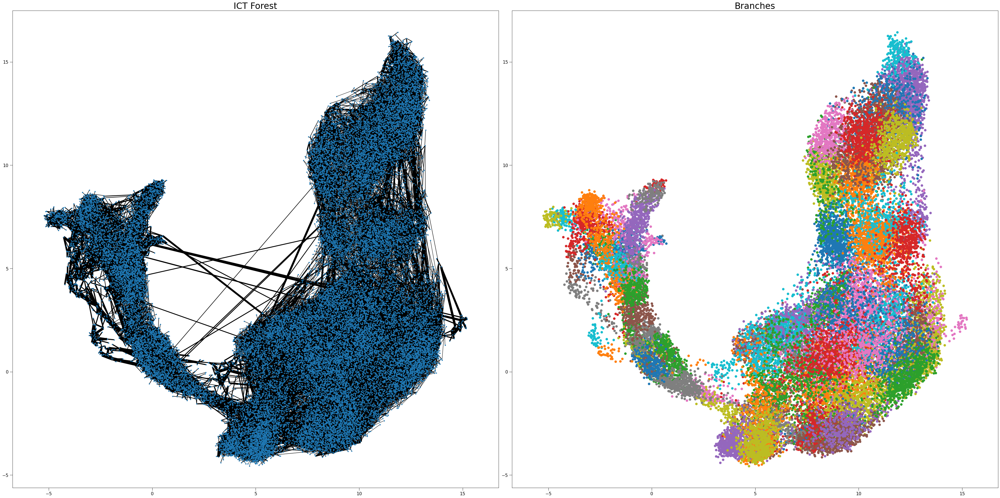

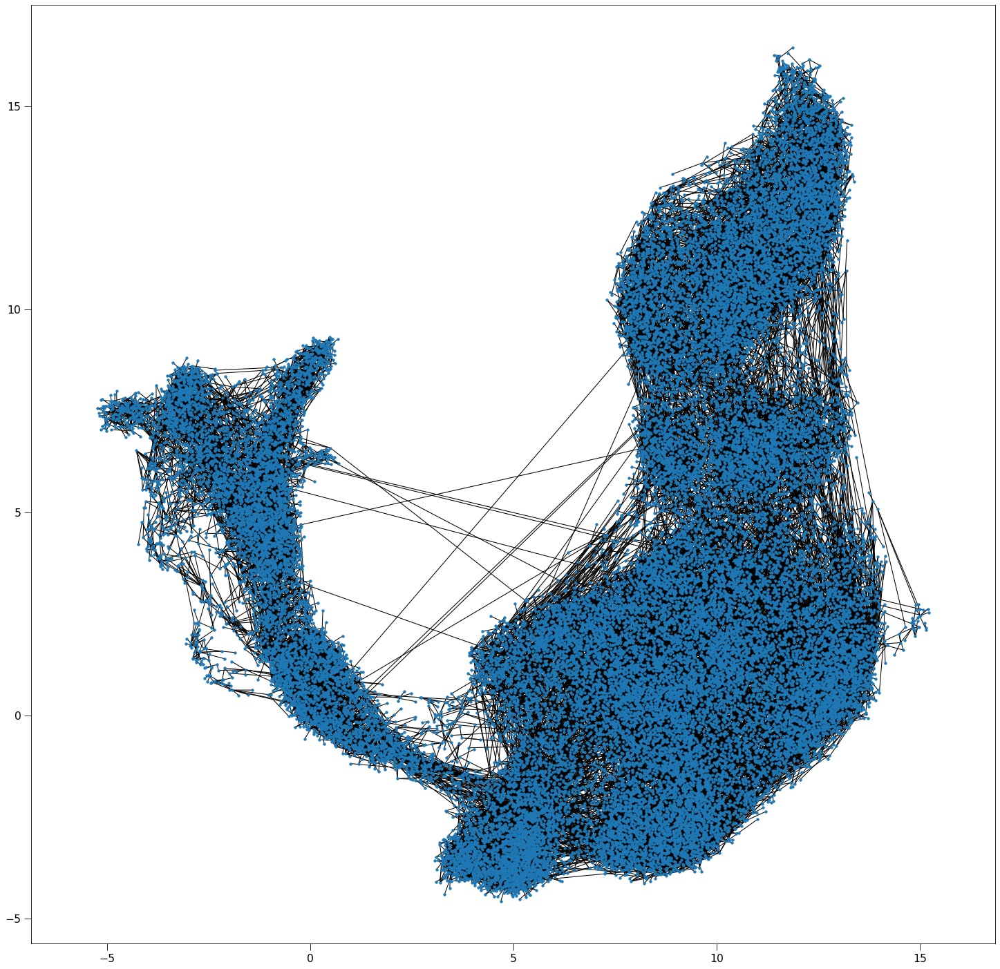

Patching the components together:   0%|          | 0/103 [00:00<?, ?it/s]

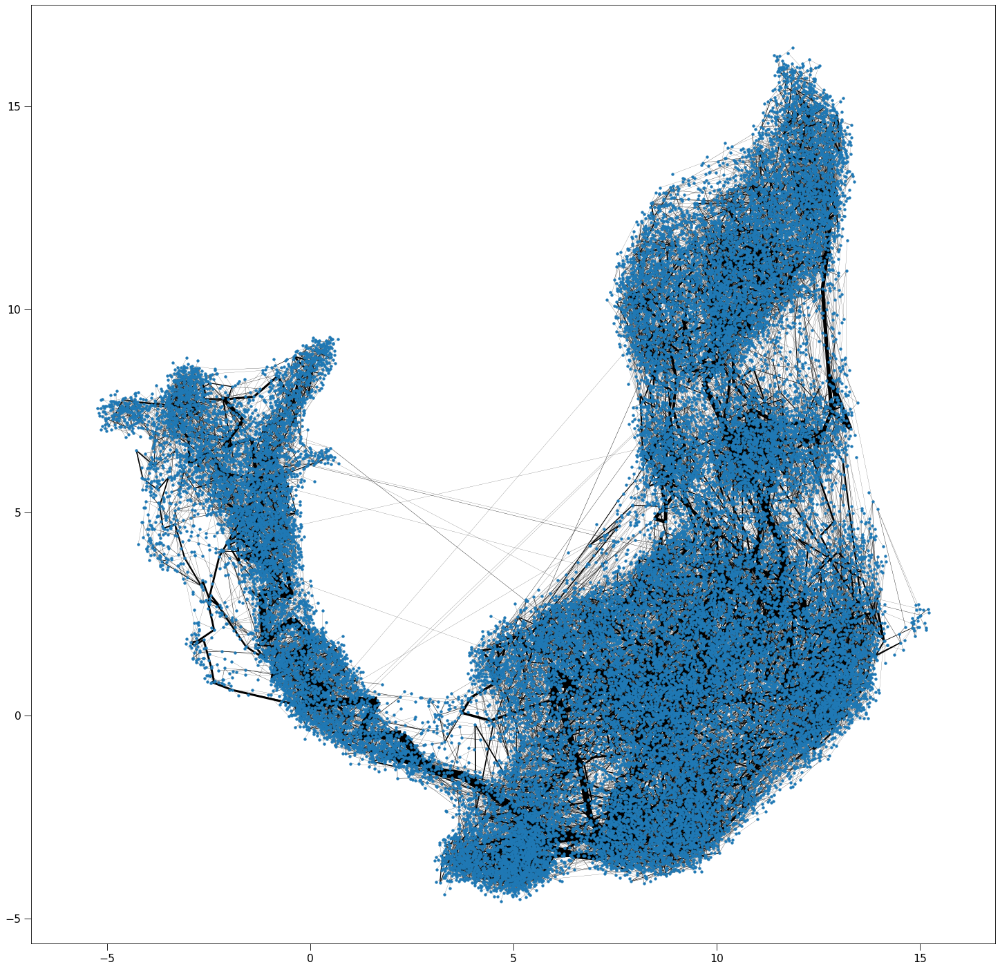

In [10]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()


##############################
           # new #           #
##############################
good_edges = []              #
for u, v in G.iterEdges():   #
    good_edges.append([u,v]) #
############################## 


G = patch_together(G, pca, 11)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [12]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1, good_edges=good_edges)
ICT.indexEdges()

create edgeId array:   0%|          | 0/37158 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/37158 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/36350 [00:00<?, ?it/s]

update Arr 37158 -> 36360
update Arr 36360 -> 36359
update Arr 36359 -> 36359
update Arr 36359 -> 36357
update Arr 36357 -> 36356
update Arr 36356 -> 36356
update Arr 36356 -> 36356
update Arr 36356 -> 36356
update Arr 36356 -> 36354
update Arr 36354 -> 36354
update Arr 36354 -> 36353
update Arr 36353 -> 36353
update Arr 36353 -> 36353
update Arr 36353 -> 36352
update Arr 36352 -> 36351
update Arr 36351 -> 36351
update Arr 36351 -> 36351
update Arr 36351 -> 36351
update Arr 36351 -> 36351
update Arr 36351 -> 36351
update Arr 36351 -> 36350
added 4 edges early


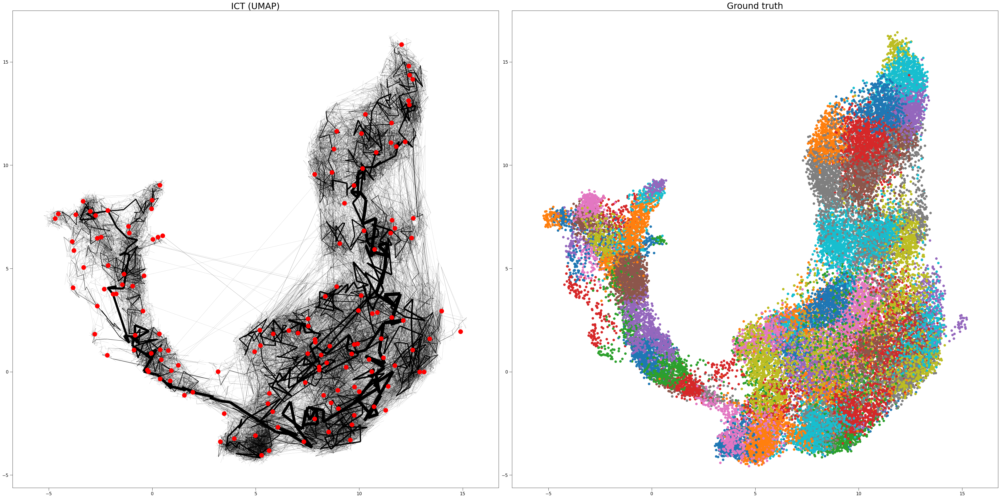

In [13]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

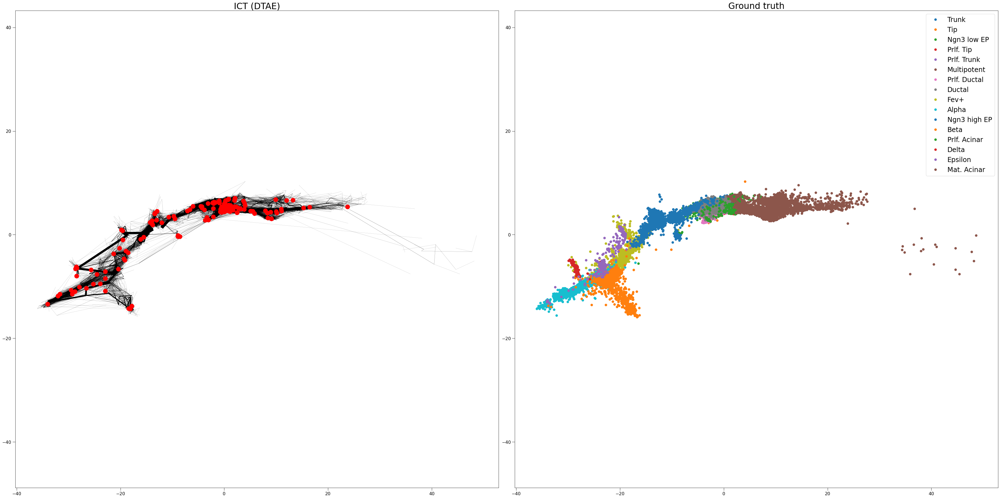

In [14]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

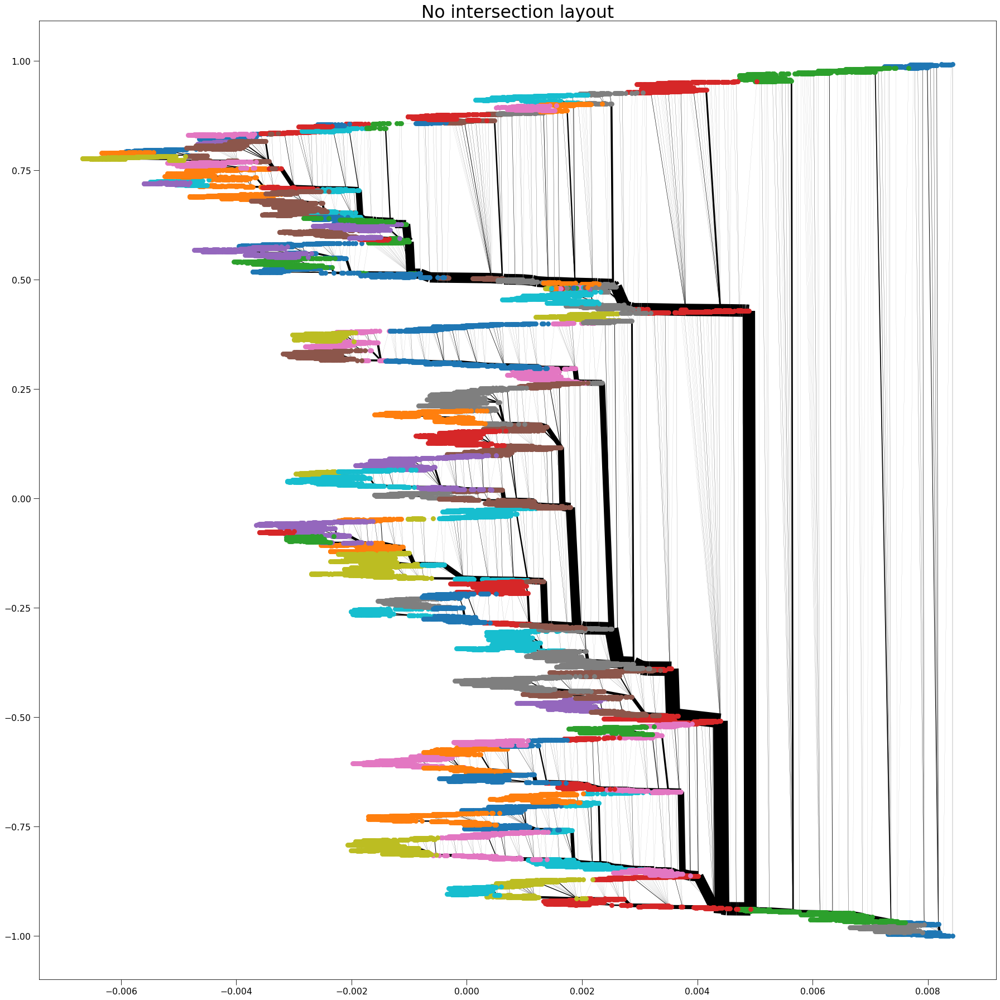

In [15]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()